In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tarfile
import zipfile
import os
import random
import time
from collections import defaultdict
import pickle
import itertools
from logging import raiseExceptions
import seaborn as sns

from PIL import Image
from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ExponentialLR
from torch.utils.data import DataLoader
from torch.utils.data import Dataset, random_split, Subset

from torchvision import transforms
import torchvision.models as models
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

# **Q1**

## Download dataset

In [2]:
# Function to download and extract the CIFAR-10 dataset
def download_and_extract_cifar10(root_dir='./data/cifar10'):
  """Downloads and extracts the CIFAR-10 dataset if not already present.

  Args:
    root_dir: The directory where the dataset should be stored.
  """
  dataset_url = "https://www.cs.toronto.edu/~kriz/cifar-10-python.tar.gz"
  dataset_filename = "cifar-10-python.tar.gz"
  extracted_dir = "cifar-10-batches-py"

  # Check if the dataset is already present
  if os.path.exists(os.path.join(root_dir, extracted_dir)):
    print("CIFAR-10 dataset already exists. Skipping download.")
    return

  # Download the dataset
  print("Downloading CIFAR-10 dataset...")
  torch.hub.download_url_to_file(dataset_url, dataset_filename)

  # Extract the dataset
  print("Extracting CIFAR-10 dataset...")
  with tarfile.open(dataset_filename, "r:gz") as tar:
    tar.extractall(root_dir)

  # Remove the downloaded archive
  os.remove(dataset_filename)
  print("CIFAR-10 dataset downloaded and extracted successfully.")

In [3]:
class CIFAR10Dataset(Dataset):
    def __init__(self, root_dir, train=True, transform=None):
        self.root_dir = root_dir
        self.train = train
        self.transform = transform
        self.data = []
        self.targets = []

        if self.train:
            data_dir = os.path.join(self.root_dir, 'cifar-10-batches-py')
            for i in range(1, 6):
                batch_path = os.path.join(data_dir, f'data_batch_{i}')
                with open(batch_path, 'rb') as f:
                    entry = pickle.load(f, encoding='bytes')
                    self.data.extend(entry[b'data'])
                    self.targets.extend(entry[b'labels'])
        else:
            data_dir = os.path.join(self.root_dir, 'cifar-10-batches-py')
            batch_path = os.path.join(data_dir, 'test_batch')
            with open(batch_path, 'rb') as f:
                entry = pickle.load(f, encoding='bytes')
                self.data.extend(entry[b'data'])
                self.targets.extend(entry[b'labels'])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img = self.data[idx]
        img = img.reshape(3, 32, 32).transpose((1, 2, 0))
        img = Image.fromarray(img)

        if self.transform:
            img = self.transform(img)

        label = self.targets[idx]
        return img, label

In [4]:
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomHorizontalFlip(p = 0.5),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.49139968, 0.48215827, 0.44653124],
        std=[0.24703233, 0.24348505, 0.26158768]
    )
])

# Download and extract the dataset
download_and_extract_cifar10()

# Create the datasets
train_dataset = CIFAR10Dataset(root_dir='./data/cifar10', train=True, transform=transform)
test_dataset = CIFAR10Dataset(root_dir='./data/cifar10', train=False, transform=transform)

100%|██████████| 163M/163M [00:03<00:00, 43.3MB/s]


Extracting CIFAR-10 dataset...
CIFAR-10 dataset downloaded and extracted successfully.


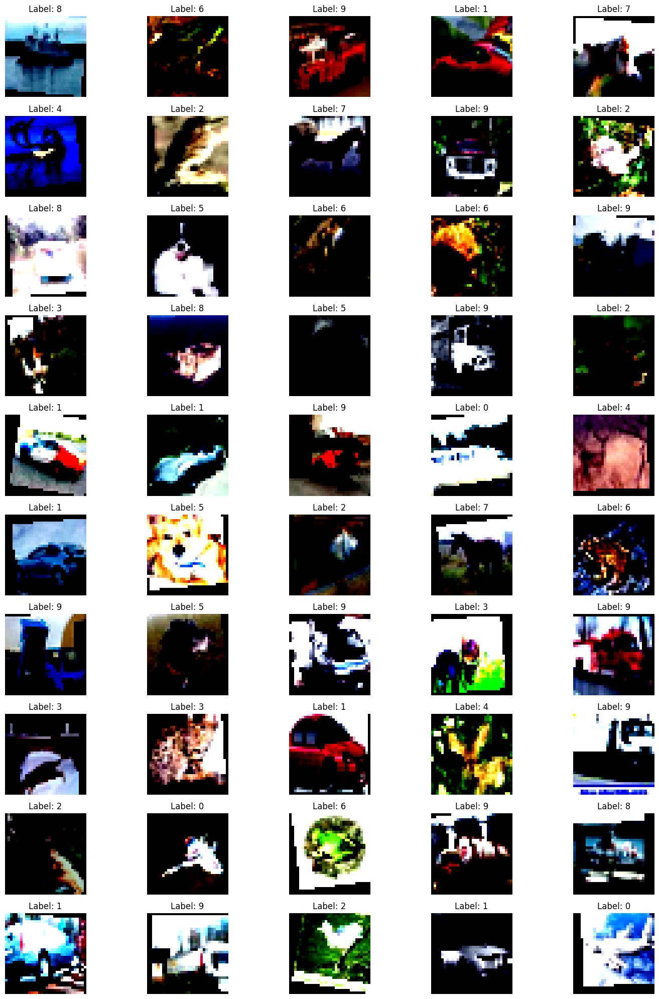

In [6]:
plot_random_images_with_labels(train_dataset)

## Data Preprocessing

In [7]:
# Create a dictionary to store indices of each class
class_indices = defaultdict(list)
for i, (image, label) in enumerate(train_dataset):
    class_indices[label].append(i)

# Create a list to store indices for validation set
val_indices = []
for label in range(10):
    val_indices.extend(class_indices[label][:1000])  # Select 1000 instances from each class

# Create validation and training datasets using Subset
val_dataset = Subset(train_dataset, val_indices)
train_indices = [i for i in range(len(train_dataset)) if i not in val_indices]
train_dataset = Subset(train_dataset, train_indices)

# Print the lengths of the datasets
print(f"Train dataset length: {len(train_dataset)}")
print(f"Validation dataset length: {len(val_dataset)}")
print(f"Test dataset length: {len(test_dataset)}")

Train dataset length: 40000
Validation dataset length: 10000
Test dataset length: 10000


In [8]:
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

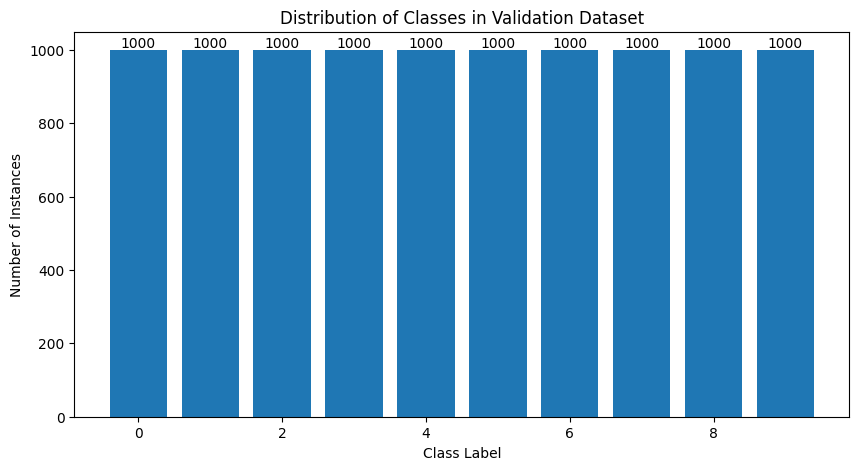

In [9]:
# Create a dictionary to store the class counts
class_counts = {}
for _, label in val_dataset:
  if label not in class_counts:
    class_counts[label] = 0
  class_counts[label] += 1

# Extract the class labels and counts
labels = list(class_counts.keys())
counts = list(class_counts.values())

# Plot the distribution
plt.figure(figsize=(10, 5))
plt.bar(labels, counts)
plt.xlabel("Class Label")
plt.ylabel("Number of Instances")
plt.title("Distribution of Classes in Validation Dataset")

# Add the exact number of instances above each bar
for i, count in enumerate(counts):
  plt.text(i, count, str(count), ha='center', va='bottom')

plt.show()


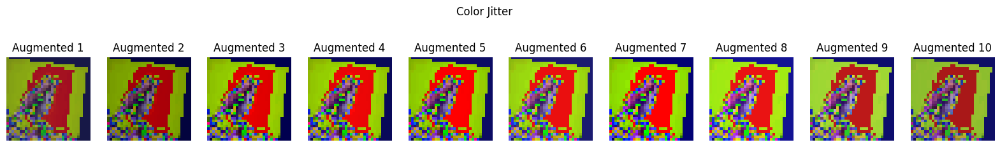

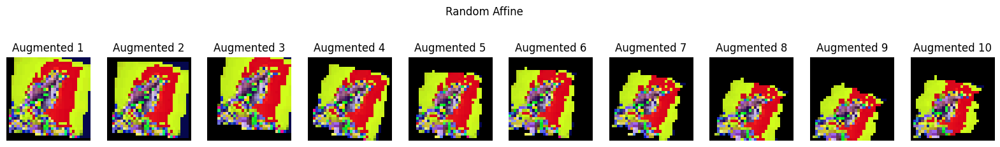

In [17]:
# Select a random image from the dataset
image_index = random.randint(0, len(train_dataset) - 1)
image, label = train_dataset[image_index]

# Convert tensor to PIL Image
image_pil = transforms.ToPILImage()(image)

# Define color jitter and affine random transformations
color_jitter = transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25)
affine_random = transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1))

# Apply transformations and display results
fig, axes = plt.subplots(1, 10, figsize=(20, 3))
fig.suptitle("Color Jitter")

for i in range(10):
  image_pil = color_jitter(image_pil)
  axes[i].imshow(image_pil)
  axes[i].set_title(f"Augmented {i+1}")
  axes[i].axis('off')
plt.show()


image_pil = transforms.ToPILImage()(image)

# Apply transformations and display results
fig, axes = plt.subplots(1, 10, figsize=(20, 3))
fig.suptitle("Random Affine")

for i in range(10):
  image_pil = affine_random(image_pil)
  axes[i].imshow(image_pil)
  axes[i].set_title(f"Augmented {i+1}")
  axes[i].axis('off')
plt.show()

## Visualization

In [5]:
def plot_random_images_with_labels(dataset, num_images=50):
  fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(15, 20))
  for i in range(num_images):
    random_index = random.randint(0, len(dataset) - 1)
    image, label = dataset[random_index]

    # Convert image to numpy array and clip values to [0, 1]
    image = np.clip(image.numpy().transpose((1, 2, 0)), 0, 1)

    row = i // 5
    col = i % 5
    axes[row, col].imshow(image)
    axes[row, col].set_title(f"Label: {label}")
    axes[row, col].axis('off')
  plt.tight_layout()
  plt.show()

In [ ]:
# Plot the training and validation loss
def plot_loss_and_acc(train_losses, val_losses, train_accuracies, val_accuracies):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label="Train Loss")
    plt.plot(val_losses, label="Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training & Validation Loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label="Train Accuracy")
    plt.plot(val_accuracies, label="Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.title("Training & Validation Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_confusion_matrix(all_targets, all_predictions, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """

    cm = confusion_matrix(all_targets, all_predictions)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized Confusion Matrix")
    else:
        print("Confusion Matrix, without normalization")

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [ ]:
def plot_feature_map_tSNE(model, test_loader, device):
    # Get feature representation for test data
    model.eval()
    all_features = []
    all_labels = []
    with torch.no_grad():
        for data, target in test_loader:
            # Move data to the same device as the model
            data = data.to(device)
            # Assuming your model outputs the feature before the final fully connected layer
            # Chain calls to blocks, considering the block type and MaxPool layers
            x = model.initial_layers(data)
            for block in model.blocks:
                # if isinstance(block, (BlockC)):
                #     x = block(x, test_mode=True)
                # # elif isinstance(block, nn.MaxPool2d):
                # #     x = block(x)
                # else:
                    x = block(x)

            features = model.global_avg_pool(x).reshape(data.size(0), -1)  # Get features from global average pooling
            all_features.extend(features.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    # Apply t-SNE to reduce the dimensionality to 2
    tsne = TSNE(n_components=2, random_state=42)
    tsne_results = tsne.fit_transform(np.array(all_features))

    # Plot the results
    plt.figure(figsize=(10, 8))
    for label in range(10):
        indices = [i for i, l in enumerate(all_labels) if l == label]
        plt.scatter(tsne_results[indices, 0], tsne_results[indices, 1], label=str(label))

    plt.legend()
    plt.title("t-SNE Visualization of Layer 11 Features")
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.show()

In [ ]:
def visualize_feature_maps(model, image, device):
    model.eval()
    image = image.to(device).unsqueeze(0)

    feature_maps = []
    hooks = []

    def hook_fn(module, input, output):
        """ extracting output layers """
        with torch.no_grad():
            feature_map = torch.max(output[0], dim=0)[0].cpu().numpy()  # مقدار بیشینه روی محور کانال
            feature_maps.append(feature_map)

    for layer in model.blocks:
        if isinstance(layer, torch.nn.Conv2d) or isinstance(layer, BlockE):
            hooks.append(layer.register_forward_hook(hook_fn))

    _ = model(image)

    for hook in hooks:
        hook.remove()

    num_layers = len(feature_maps)
    fig, axes = plt.subplots(1, num_layers, figsize=(15, 5))

    for i, fmap in enumerate(feature_maps):
        axes[i].imshow(fmap, cmap='viridis')
        axes[i].axis('off')
        axes[i].set_title(f'Layer {i+1}')

    plt.show()

## Implementing Models

In [ ]:
class BlockA(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(BlockA, self).__init__()

        self.conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=3,  # 3x3 convolution
            stride=1,       # Default stride
            padding=1,      # Padding to maintain spatial dimensions
            bias=False      # Bias is typically not used with BatchNorm
        )
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

In [ ]:
class BlockB(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(BlockB, self).__init__()

        self.block_a = BlockA(in_channels, out_channels)
        self.block = nn.Sequential(
            nn.Conv2d(out_channels, 1, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.block_a(x)
        return self.block(x) * x


In [ ]:
class BlockC(nn.Module):
    def __init__(self, in_channels, out_channels, reduction=16):
        super(BlockC, self).__init__()
        self.block_a = BlockA(in_channels, out_channels)  # Ensure channels match
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.fc1 = nn.Linear(out_channels, out_channels // reduction)
        self.relu = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(out_channels // reduction, out_channels)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.block_a(x)  # Apply BlockA first
        batch_size, channels, _, _ = x.size()
        y = self.global_pool(x).view(batch_size, channels)  # Global pooling
        y = self.fc1(y)
        y = self.relu(y)
        y = self.fc2(y)
        y = self.sigmoid(y).view(batch_size, channels, 1, 1)
        return x * y  # Channel-wise recalibration


In [ ]:
class DepthwiseSeparableConv(nn.Module):
    """Implements Depthwise Separable Convolution."""
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DepthwiseSeparableConv, self).__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=kernel_size,
                                   stride=stride, padding=padding, groups=in_channels, bias=False)
        self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        return x

class BlockD(nn.Module):
    def __init__(self, in_channels, out_channels, use_separable_conv=False):
        super(BlockD, self).__init__()
        self.use_shortcut = in_channels == out_channels

        if use_separable_conv:
            self.conv = DepthwiseSeparableConv(in_channels, out_channels, kernel_size=3, padding=1)
        else:
            self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)

        self.batch_norm = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

        # 1x1 Conv for channel matching when needed
        self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False) if not self.use_shortcut else nn.Identity()

    def forward(self, x):
        residual = x
        x = self.conv(x)
        x = self.batch_norm(x)

        if not self.use_shortcut:
            residual = self.shortcut(residual)

        x += residual  # Skip connection
        x = self.relu(x)
        return x

In [ ]:
class BlockE(nn.Module):
    def __init__(self, in_channels, out_channels, b=4, g=8):
        super(BlockE, self).__init__()

        b_channels = out_channels // b  # Reduce dimensions for grouped conv

        # First 1x1 convolution
        self.conv1x1_1 = nn.Conv2d(in_channels, b_channels, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(b_channels)
        self.relu = nn.ReLU(inplace=True)

        # Grouped 3x3 convolution
        self.conv3x3 = nn.Conv2d(b_channels, b_channels, kernel_size=3, padding=1, groups=in_channels // g, bias=False)
        self.bn2 = nn.BatchNorm2d(b_channels)

        # Second 1x1 convolution
        self.conv1x1_2 = nn.Conv2d(b_channels, out_channels, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(out_channels)

        # Branch 2: Projection if input channels ≠ output channels
        self.projection = None
        if in_channels != out_channels:
            self.projection = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)

    def forward(self, x):
        identity = x  # Keep original input for skip connection

        # Main Path
        out = self.conv1x1_1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv3x3(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv1x1_2(out)
        out = self.bn3(out)

        # Branch 2: Apply projection if in_channels ≠ out_channels
        if self.projection is not None:
            identity = self.projection(identity)

        # Branch 3: Direct skip connection if dimensions match
        out += identity  # Skip connection
        out = self.relu(out)

        return out


### base

In [ ]:
class BaseCNN(nn.Module):
    def __init__(self, block_config, use_separable_conv=False):
        super(BaseCNN, self).__init__()

        block_map = {'A': BlockA, 'B': BlockB, 'C': BlockC, 'D': BlockD, 'E': BlockE}

        # Initial layers based on the table
        self.initial_layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )

        # Channel sizes between layers (according to table)
        channels = [128, 128, 128, 256, 256, 256, 512, 512, 512]

        # Create the 8 configurable blocks
        self.blocks = nn.ModuleList()
        for i, block in enumerate(block_config):
            in_channels = channels[i]
            out_channels = channels[i + 1] if i < len(channels)-1 else channels[i]

            # Instantiate blocks with special conditions
            if block == 'D':
                self.blocks.append(block_map[block](in_channels, out_channels, use_separable_conv))
            else:
                self.blocks.append(block_map[block](in_channels, out_channels))

            # Add MaxPool at specific locations based on table
            if i in [2, 4, 7]:
                self.blocks.append(nn.MaxPool2d(kernel_size=2, stride=2))

        # Final layers (based on table)
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.dropout = nn.Dropout(p=0.25)
        self.fc = nn.Linear(512, 10)

    def forward(self, x, test_mode=False):
        x = self.initial_layers(x)

        for block in self.blocks:
            x = block(x)  # Forward pass through each block

        x = self.global_avg_pool(x)
        x = torch.flatten(x, 1)
        x = self.dropout(x)
        x = self.fc(x)
        return x


In [ ]:
def train_model(train_loader, val_loader, device = torch.device("cuda" if torch.cuda.is_available() else "cpu"),
                block_config=['A']*8, batch_size = 64,
                num_workers = 2, loss = "CE", lr=0.1, momentum=0.5,
                gamma=0.99, num_epochs = 30, use_separable_conv=False):

    model = BaseCNN(block_config, use_separable_conv=use_separable_conv)
    model.to(device)

    # Define the optimizer (SGD)
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum)

    # Define the learning rate scheduler (ExponentialLR)
    scheduler = ExponentialLR(optimizer, gamma=gamma)

    # Define the loss function (Cross-Entropy)
    if loss == "CE":
        criterion = nn.CrossEntropyLoss()


    # Lists to store loss and accuracy
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    start_time = time.time()

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        for batch_idx, (data, target) in enumerate(train_loader):
            data, target = data.to(device), target.to(device)

            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(output, 1)
            total_train += target.size(0)
            correct_train += (predicted == target).sum().item()

            if batch_idx % 100 == 0:
                print(f"Epoch: {epoch+1}/{num_epochs}, Batch: {batch_idx}/{len(train_loader)}, Loss: {loss.item():.4f}")

        # Calculate epoch loss and accuracy
        avg_train_loss = running_loss / len(train_loader)
        train_accuracy = 100 * correct_train / total_train
        train_losses.append(avg_train_loss)
        train_accuracies.append(train_accuracy)

        # Validation loop
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0

        with torch.no_grad():
            for data, target in val_loader:
                data, target = data.to(device), target.to(device)
                output = model(data)
                loss = criterion(output, target)
                val_loss += loss.item()
                _, predicted = torch.max(output, 1)
                total_val += target.size(0)
                correct_val += (predicted == target).sum().item()

        avg_val_loss = val_loss / len(val_loader)
        val_accuracy = 100 * correct_val / total_val
        val_losses.append(avg_val_loss)
        val_accuracies.append(val_accuracy)

        print(f"Epoch: {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, Train Acc: {train_accuracy:.2f}%")
        print(f"Validation Loss: {avg_val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")

        scheduler.step()

    end_time = time.time()
    training_time = end_time - start_time

    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"Number of trainable parameters: {trainable_params}")
    print(f"Training time: {training_time:.2f} seconds")

    plot_loss_and_acc(train_losses, val_losses, train_accuracies, val_accuracies)

    return model


In [ ]:
def evaluate_model(model, test_loader, class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'],
                   device = torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    # Evaluation loop for the test data
    model.eval()
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for data, target in test_loader:
            # Move data and target to the same device as the model
            data, target = data.to(device), target.to(device)
            output = model(data)
            _, predicted = torch.max(output.data, 1)
            all_predictions.extend(predicted.cpu().numpy())
            all_targets.extend(target.cpu().numpy())

    plot_confusion_matrix(all_targets, all_predictions, classes=class_names, normalize=False, title='Confusion Matrix')

In [ ]:
# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


## A

### train

Epoch: 1/30, Batch: 0/625, Loss: 2.4738
Epoch: 1/30, Batch: 100/625, Loss: 2.0397
Epoch: 1/30, Batch: 200/625, Loss: 1.8539
Epoch: 1/30, Batch: 300/625, Loss: 1.7159
Epoch: 1/30, Batch: 400/625, Loss: 1.6374
Epoch: 1/30, Batch: 500/625, Loss: 1.6567
Epoch: 1/30, Batch: 600/625, Loss: 1.4298
Epoch: 1/30, Train Loss: 1.8502, Train Acc: 31.87%
Validation Loss: 1.5959, Validation Accuracy: 41.97%
Epoch: 2/30, Batch: 0/625, Loss: 1.4671
Epoch: 2/30, Batch: 100/625, Loss: 1.4909
Epoch: 2/30, Batch: 200/625, Loss: 1.4716
Epoch: 2/30, Batch: 300/625, Loss: 1.3926
Epoch: 2/30, Batch: 400/625, Loss: 1.1685
Epoch: 2/30, Batch: 500/625, Loss: 1.3210
Epoch: 2/30, Batch: 600/625, Loss: 1.0390
Epoch: 2/30, Train Loss: 1.3007, Train Acc: 52.93%
Validation Loss: 1.3067, Validation Accuracy: 54.41%
Epoch: 3/30, Batch: 0/625, Loss: 1.0708
Epoch: 3/30, Batch: 100/625, Loss: 1.0163
Epoch: 3/30, Batch: 200/625, Loss: 1.2506
Epoch: 3/30, Batch: 300/625, Loss: 1.0525
Epoch: 3/30, Batch: 400/625, Loss: 0.9436


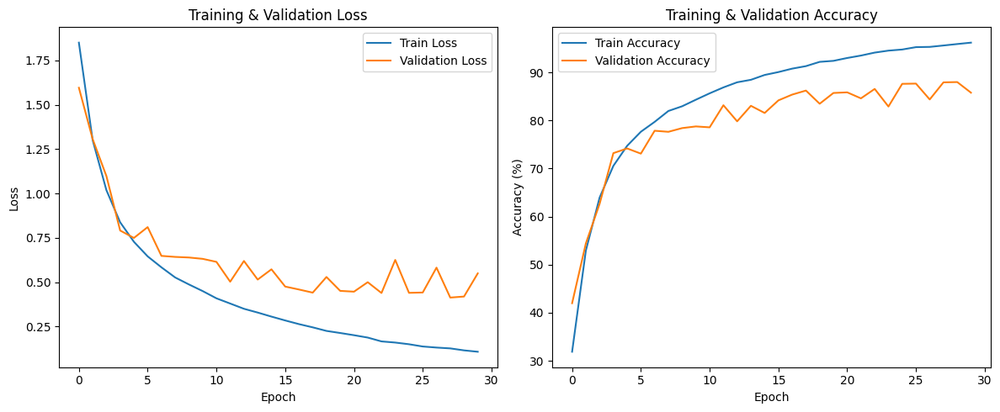

In [ ]:
model_a = train_model(train_loader, val_loader,
                      block_config=['A']*8, batch_size = 64,
                      num_workers = 2, loss = "CE", lr=0.1, momentum=0.5,
                      gamma=0.99, num_epochs = 30)

### evaluate

Confusion Matrix, without normalization


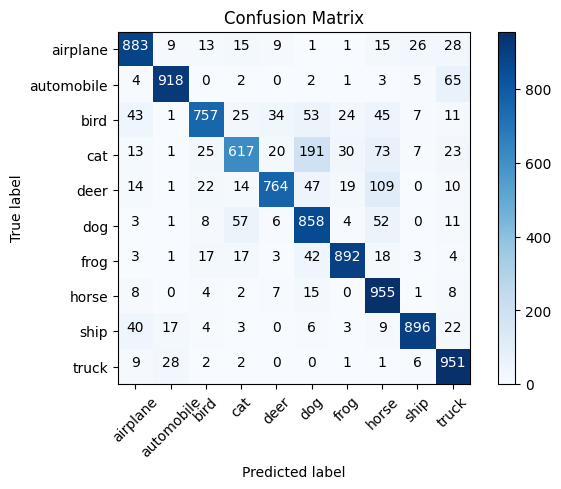

In [ ]:
evaluate_model(model_a, test_loader, device)

Confusion Matrix, without normalization


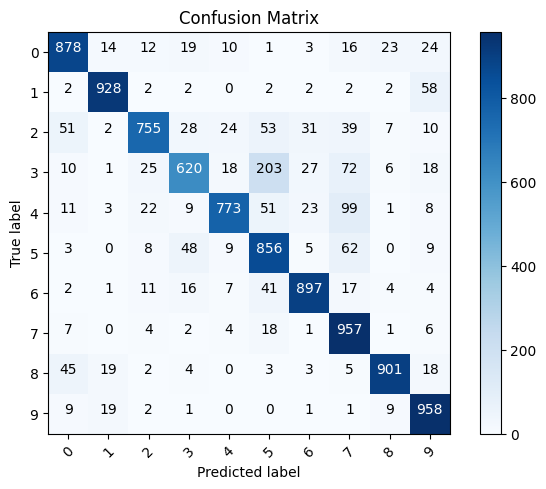

In [ ]:
evaluate_model(model_a, test_loader, device = device, class_names=range(10))

### t-SNE

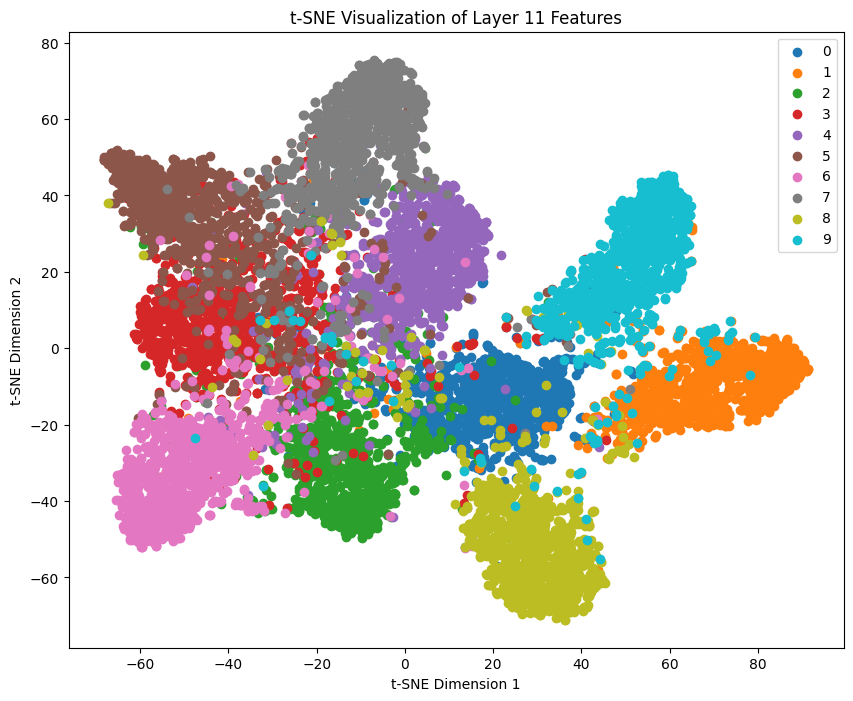

In [ ]:
plot_feature_map_tSNE(model_a, test_loader, device)

## B

Epoch: 1/30, Batch: 0/625, Loss: 2.3400
Epoch: 1/30, Batch: 100/625, Loss: 2.0443
Epoch: 1/30, Batch: 200/625, Loss: 1.8344
Epoch: 1/30, Batch: 300/625, Loss: 1.7069
Epoch: 1/30, Batch: 400/625, Loss: 1.5299
Epoch: 1/30, Batch: 500/625, Loss: 1.5723
Epoch: 1/30, Batch: 600/625, Loss: 1.7229
Epoch: 1/30, Train Loss: 1.6928, Train Acc: 36.73%
Validation Loss: 1.5173, Validation Accuracy: 46.29%
Epoch: 2/30, Batch: 0/625, Loss: 1.3144
Epoch: 2/30, Batch: 100/625, Loss: 1.0988
Epoch: 2/30, Batch: 200/625, Loss: 1.2062
Epoch: 2/30, Batch: 300/625, Loss: 1.1608
Epoch: 2/30, Batch: 400/625, Loss: 0.9812
Epoch: 2/30, Batch: 500/625, Loss: 0.8260
Epoch: 2/30, Batch: 600/625, Loss: 1.1363
Epoch: 2/30, Train Loss: 1.1556, Train Acc: 58.39%
Validation Loss: 1.1651, Validation Accuracy: 60.00%
Epoch: 3/30, Batch: 0/625, Loss: 1.0791
Epoch: 3/30, Batch: 100/625, Loss: 1.0627
Epoch: 3/30, Batch: 200/625, Loss: 0.7749
Epoch: 3/30, Batch: 300/625, Loss: 0.8792
Epoch: 3/30, Batch: 400/625, Loss: 0.9395


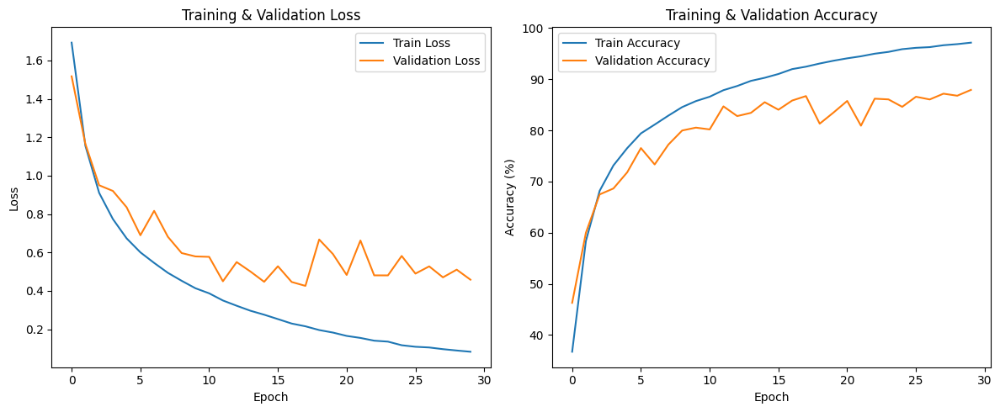

In [ ]:
model_b = train_model(train_loader, val_loader, device,
                      block_config=['B']*8, batch_size = 64,
                      num_workers = 2, loss = "CE", lr=0.1, momentum=0.5,
                      gamma=0.99, num_epochs = 30)

Confusion Matrix, without normalization


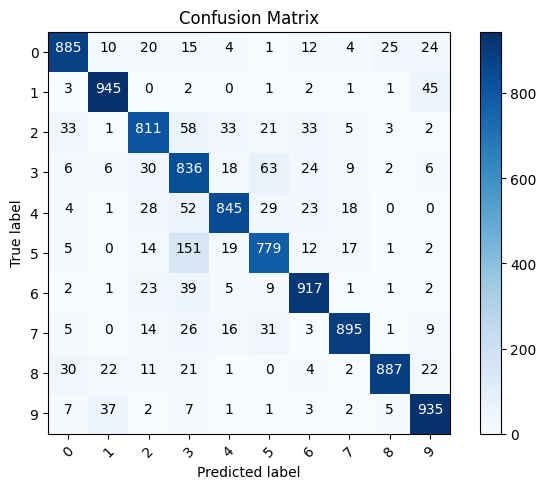

In [ ]:
evaluate_model(model_b, test_loader, device = device, class_names=range(10))

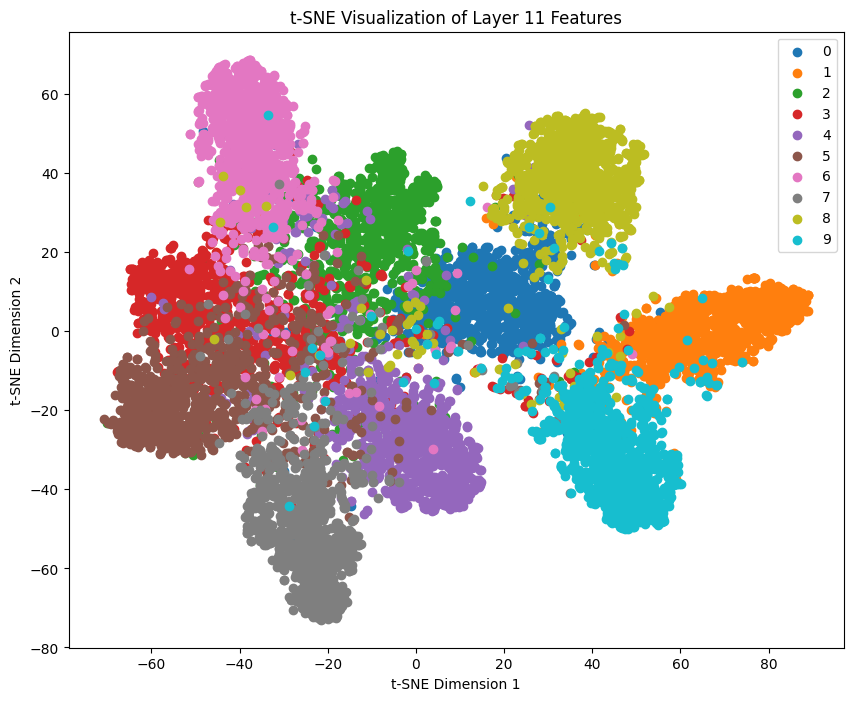

In [ ]:
plot_feature_map_tSNE(model_b, test_loader, device)

## C

Epoch: 1/30, Batch: 0/625, Loss: 2.3781
Epoch: 1/30, Batch: 100/625, Loss: 1.8467
Epoch: 1/30, Batch: 200/625, Loss: 1.6492
Epoch: 1/30, Batch: 300/625, Loss: 1.4938
Epoch: 1/30, Batch: 400/625, Loss: 1.5199
Epoch: 1/30, Batch: 500/625, Loss: 1.2812
Epoch: 1/30, Batch: 600/625, Loss: 1.2848
Epoch: 1/30, Train Loss: 1.5269, Train Acc: 43.40%
Validation Loss: 1.6639, Validation Accuracy: 44.63%
Epoch: 2/30, Batch: 0/625, Loss: 1.0825
Epoch: 2/30, Batch: 100/625, Loss: 0.9613
Epoch: 2/30, Batch: 200/625, Loss: 1.1050
Epoch: 2/30, Batch: 300/625, Loss: 0.9158
Epoch: 2/30, Batch: 400/625, Loss: 0.7735
Epoch: 2/30, Batch: 500/625, Loss: 0.8782
Epoch: 2/30, Batch: 600/625, Loss: 0.9831
Epoch: 2/30, Train Loss: 1.0255, Train Acc: 63.78%
Validation Loss: 0.9678, Validation Accuracy: 66.00%
Epoch: 3/30, Batch: 0/625, Loss: 0.8376
Epoch: 3/30, Batch: 100/625, Loss: 0.8397
Epoch: 3/30, Batch: 200/625, Loss: 0.6445
Epoch: 3/30, Batch: 300/625, Loss: 0.8173
Epoch: 3/30, Batch: 400/625, Loss: 0.7783


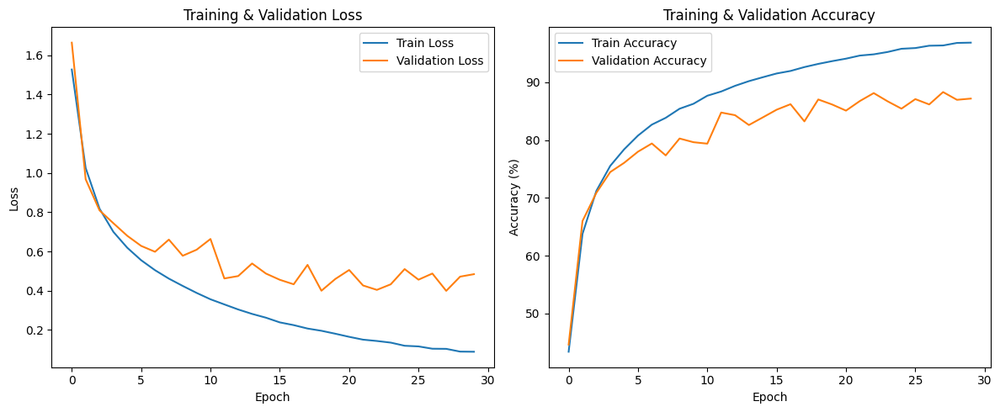

In [ ]:
model_c = train_model(train_loader, val_loader, device,
                      block_config=['C']*8, batch_size = 64,
                      num_workers = 2, loss = "CE", lr=0.1, momentum=0.5,
                      gamma=0.99, num_epochs = 30)

Confusion Matrix, without normalization


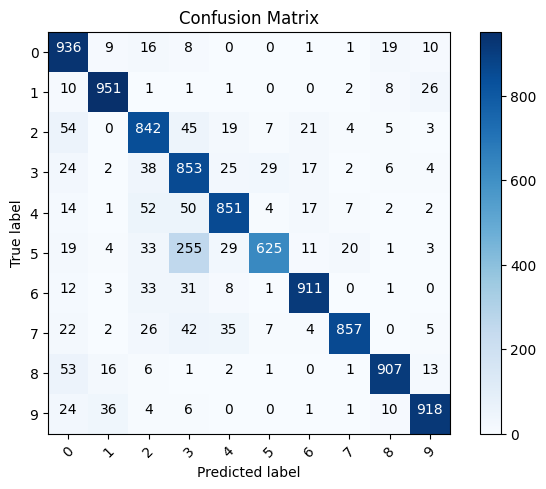

In [ ]:
evaluate_model(model_c, test_loader, device = device, class_names=range(10))

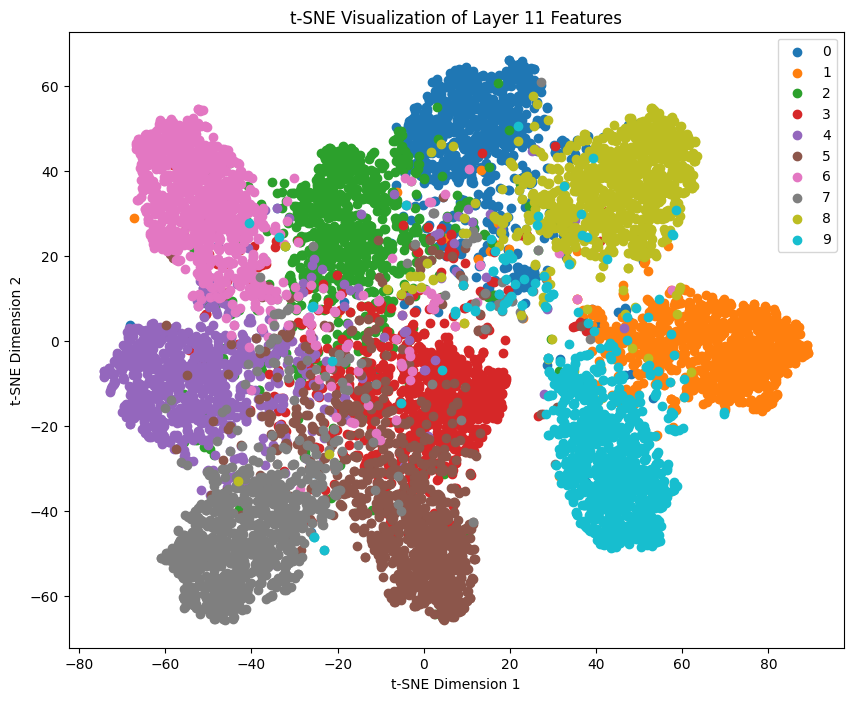

In [ ]:
plot_feature_map_tSNE(model_c, test_loader, device)

## D

Epoch: 1/30, Batch: 0/625, Loss: 3.5479
Epoch: 1/30, Batch: 100/625, Loss: 2.2402
Epoch: 1/30, Batch: 200/625, Loss: 2.5015
Epoch: 1/30, Batch: 300/625, Loss: 2.4703
Epoch: 1/30, Batch: 400/625, Loss: 2.1393
Epoch: 1/30, Batch: 500/625, Loss: 2.1813
Epoch: 1/30, Batch: 600/625, Loss: 1.9220
Epoch: 1/30, Train Loss: 2.6901, Train Acc: 16.34%
Validation Loss: 2.0007, Validation Accuracy: 24.41%
Epoch: 2/30, Batch: 0/625, Loss: 1.9438
Epoch: 2/30, Batch: 100/625, Loss: 1.7414
Epoch: 2/30, Batch: 200/625, Loss: 1.8990
Epoch: 2/30, Batch: 300/625, Loss: 1.6577
Epoch: 2/30, Batch: 400/625, Loss: 1.6753
Epoch: 2/30, Batch: 500/625, Loss: 1.5741
Epoch: 2/30, Batch: 600/625, Loss: 1.6281
Epoch: 2/30, Train Loss: 1.7727, Train Acc: 33.97%
Validation Loss: 1.6009, Validation Accuracy: 41.20%
Epoch: 3/30, Batch: 0/625, Loss: 1.6865
Epoch: 3/30, Batch: 100/625, Loss: 1.4352
Epoch: 3/30, Batch: 200/625, Loss: 1.4693
Epoch: 3/30, Batch: 300/625, Loss: 1.3701
Epoch: 3/30, Batch: 400/625, Loss: 1.2978


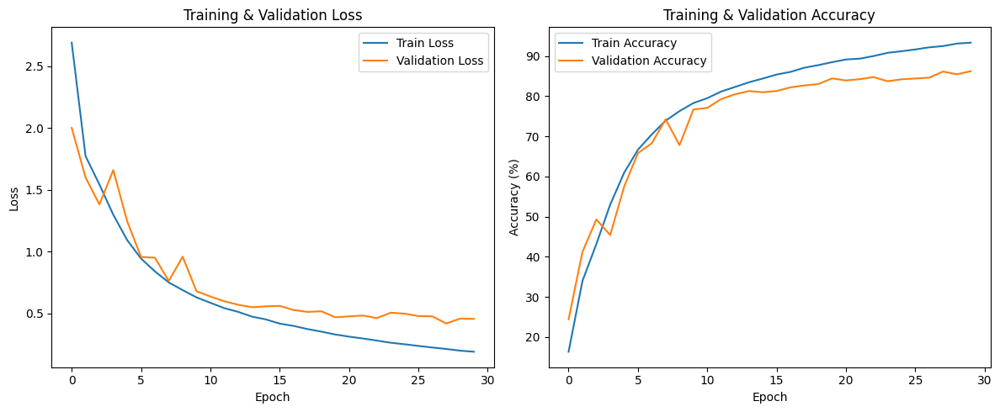

In [ ]:
model_d = train_model(train_loader, val_loader, device,
                      block_config=['D']*8, batch_size = 64,
                      num_workers = 2, loss = "CE", lr=0.1, momentum=0.5,
                      gamma=0.99, num_epochs = 30)

Confusion Matrix, without normalization


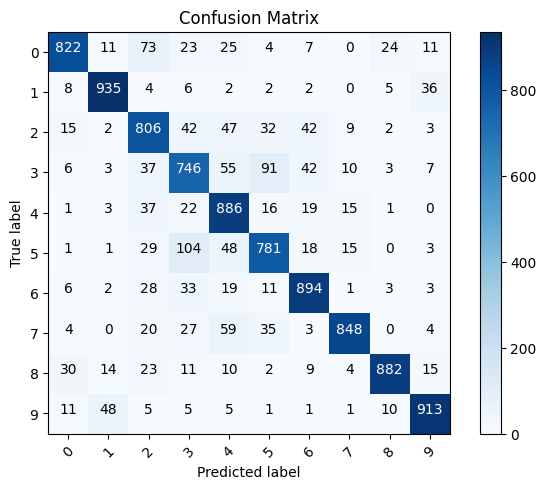

In [ ]:
evaluate_model(model_d, test_loader, device = device, class_names=range(10))

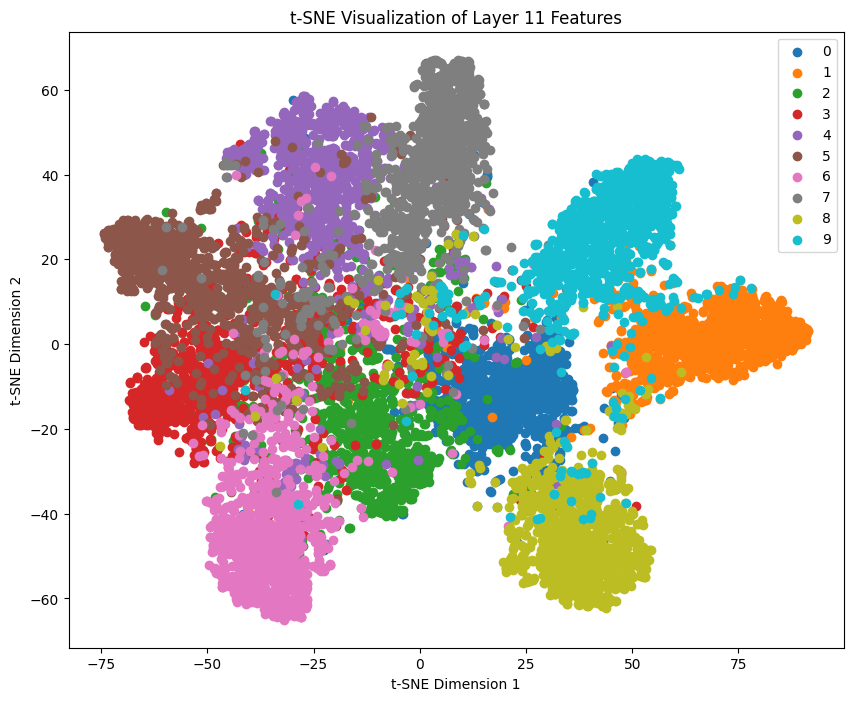

In [ ]:
plot_feature_map_tSNE(model_d, test_loader, device)

## *D depth wise separable*

Epoch: 1/30, Batch: 0/625, Loss: 2.8715
Epoch: 1/30, Batch: 100/625, Loss: 2.7526
Epoch: 1/30, Batch: 200/625, Loss: 2.9174
Epoch: 1/30, Batch: 300/625, Loss: 2.3269
Epoch: 1/30, Batch: 400/625, Loss: 2.4708
Epoch: 1/30, Batch: 500/625, Loss: 2.4535
Epoch: 1/30, Batch: 600/625, Loss: 2.1575
Epoch: 1/30, Train Loss: 18.9438, Train Acc: 13.49%
Validation Loss: 2.1960, Validation Accuracy: 16.92%
Epoch: 2/30, Batch: 0/625, Loss: 2.3090
Epoch: 2/30, Batch: 100/625, Loss: 2.3699
Epoch: 2/30, Batch: 200/625, Loss: 2.2994
Epoch: 2/30, Batch: 300/625, Loss: 2.1859
Epoch: 2/30, Batch: 400/625, Loss: 2.5715
Epoch: 2/30, Batch: 500/625, Loss: 2.0861
Epoch: 2/30, Batch: 600/625, Loss: 2.2256
Epoch: 2/30, Train Loss: 2.1708, Train Acc: 19.59%
Validation Loss: 2.2280, Validation Accuracy: 16.96%
Epoch: 3/30, Batch: 0/625, Loss: 2.3814
Epoch: 3/30, Batch: 100/625, Loss: 2.0858
Epoch: 3/30, Batch: 200/625, Loss: 1.9659
Epoch: 3/30, Batch: 300/625, Loss: 2.0041
Epoch: 3/30, Batch: 400/625, Loss: 1.9220

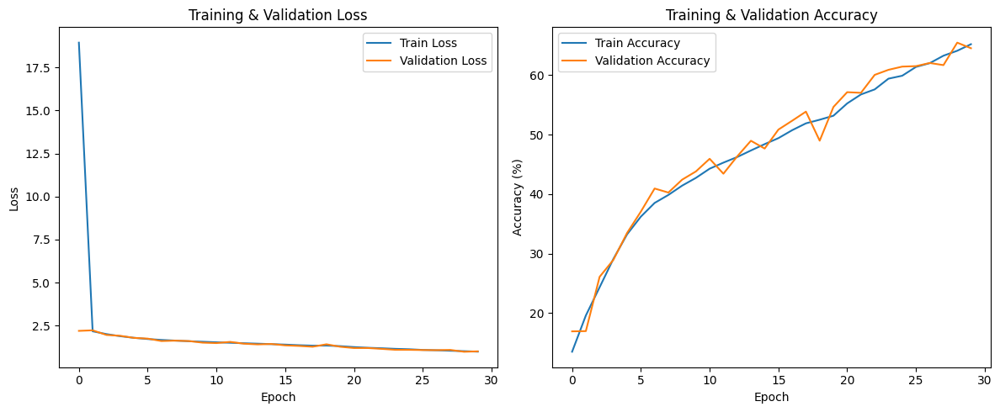

In [ ]:
model_d2 = train_model(train_loader, val_loader, device,
                      block_config=['D']*8, batch_size = 64,
                      num_workers = 2, loss = "CE", lr=0.1, momentum=0.5,
                      gamma=0.99, num_epochs = 30, use_separable_conv=True)

Confusion Matrix, without normalization


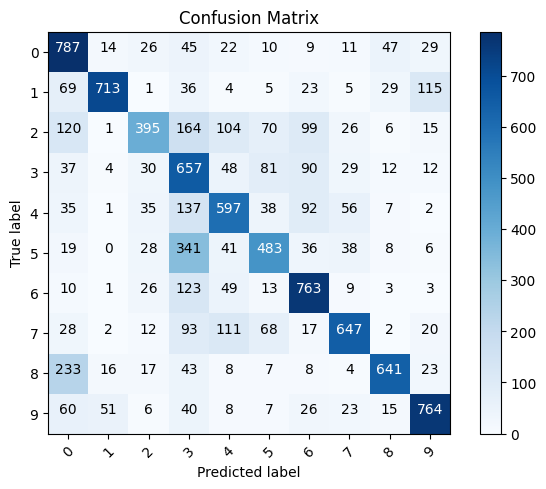

In [ ]:
evaluate_model(model_d2, test_loader, device = device, class_names=range(10))

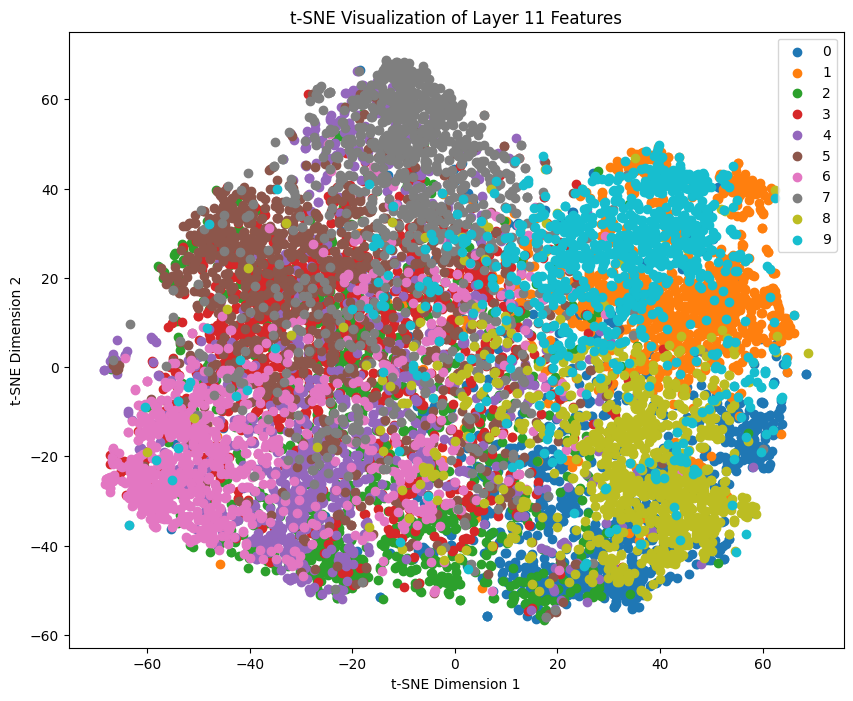

In [ ]:
plot_feature_map_tSNE(model_d2, test_loader, device)

## E

Epoch: 1/30, Batch: 0/625, Loss: 3.2609
Epoch: 1/30, Batch: 100/625, Loss: 3.3941
Epoch: 1/30, Batch: 200/625, Loss: 2.4049
Epoch: 1/30, Batch: 300/625, Loss: 2.7332
Epoch: 1/30, Batch: 400/625, Loss: 2.1852
Epoch: 1/30, Batch: 500/625, Loss: 2.3063
Epoch: 1/30, Batch: 600/625, Loss: 2.2798
Epoch: 1/30, Train Loss: 7.4164, Train Acc: 16.79%
Validation Loss: 2.2637, Validation Accuracy: 23.59%
Epoch: 2/30, Batch: 0/625, Loss: 2.2251
Epoch: 2/30, Batch: 100/625, Loss: 2.0541
Epoch: 2/30, Batch: 200/625, Loss: 2.1498
Epoch: 2/30, Batch: 300/625, Loss: 1.8469
Epoch: 2/30, Batch: 400/625, Loss: 1.9310
Epoch: 2/30, Batch: 500/625, Loss: 1.8326
Epoch: 2/30, Batch: 600/625, Loss: 1.8504
Epoch: 2/30, Train Loss: 1.9472, Train Acc: 28.40%
Validation Loss: 1.8557, Validation Accuracy: 31.31%
Epoch: 3/30, Batch: 0/625, Loss: 2.0365
Epoch: 3/30, Batch: 100/625, Loss: 1.9290
Epoch: 3/30, Batch: 200/625, Loss: 1.9666
Epoch: 3/30, Batch: 300/625, Loss: 1.4606
Epoch: 3/30, Batch: 400/625, Loss: 1.5406


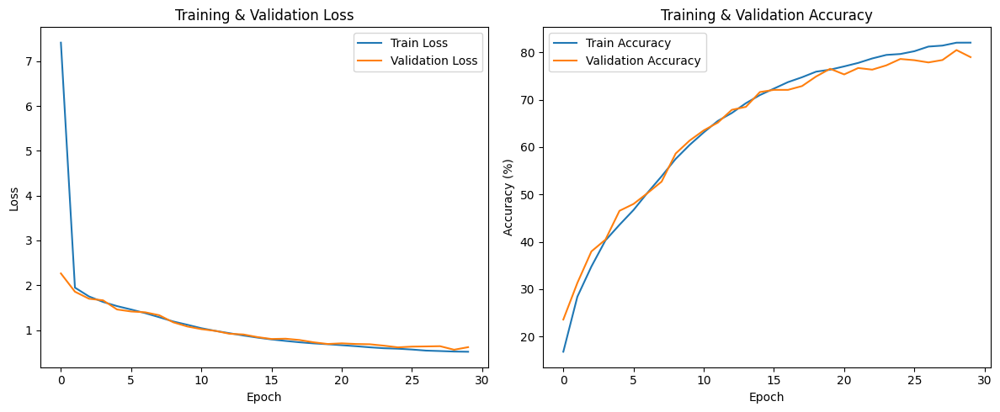

In [ ]:
model_e = train_model(train_loader, val_loader, device,
                      block_config=['E']*8, batch_size = 64,
                      num_workers = 2, loss = "CE", lr=0.1, momentum=0.5,
                      gamma=0.99, num_epochs = 30)

Confusion Matrix, without normalization


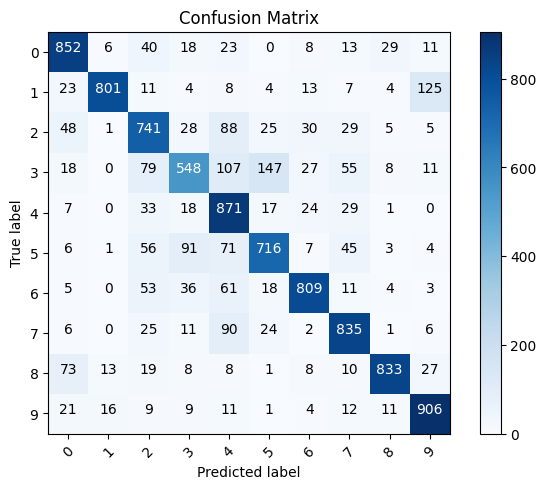

In [ ]:
evaluate_model(model_e, test_loader, device = device, class_names=range(10))

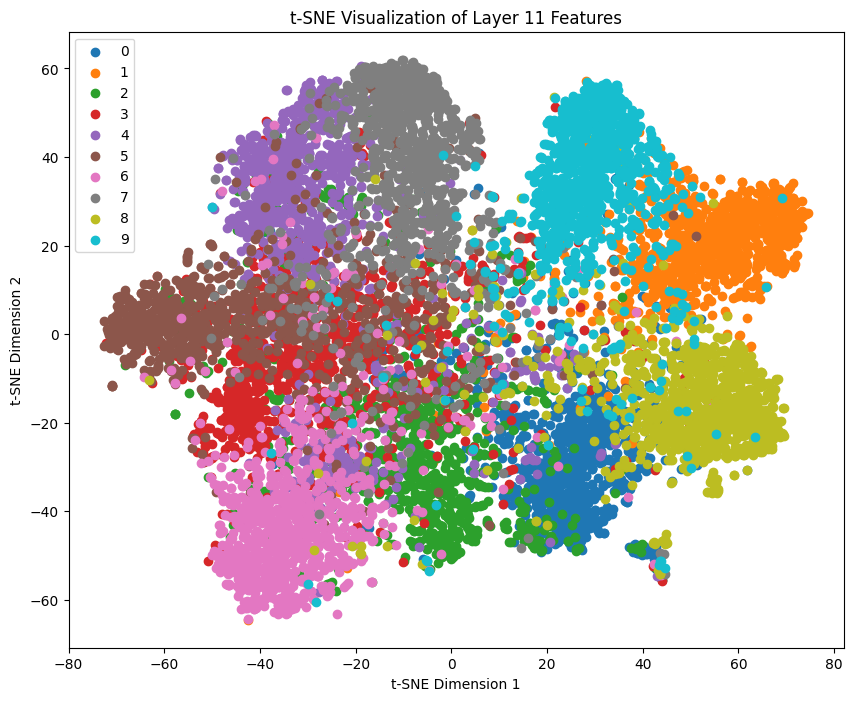

In [ ]:
plot_feature_map_tSNE(model_e, test_loader, device)

## Feature Maps during the layers

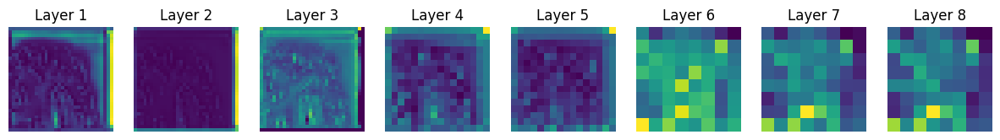

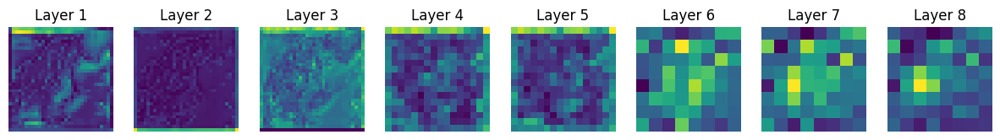

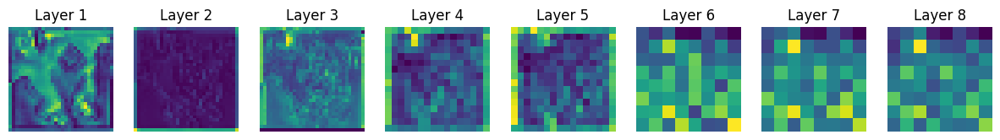

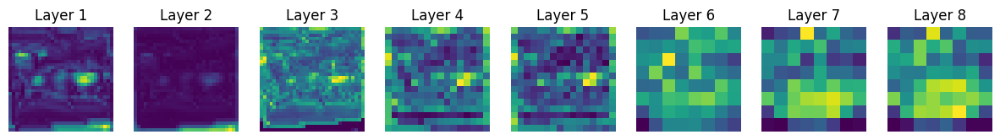

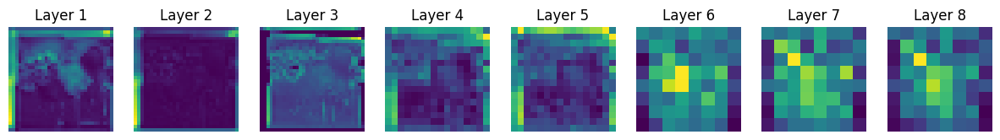

...

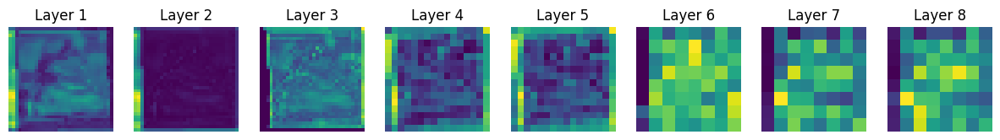

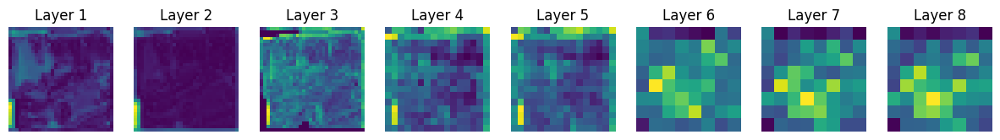

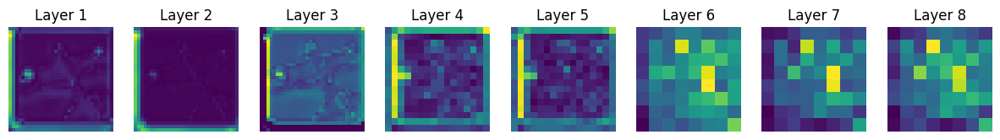

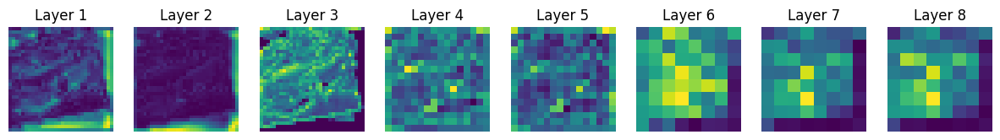

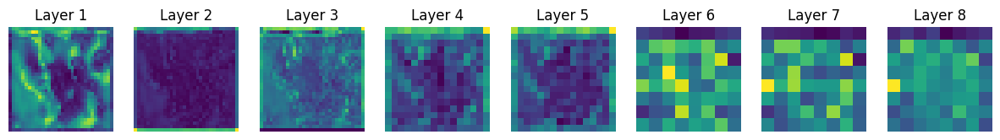

In [ ]:
sample_image, _ = next(iter(train_loader))

for img in sample_image[:20]:
    visualize_feature_maps(model_e, img, device)


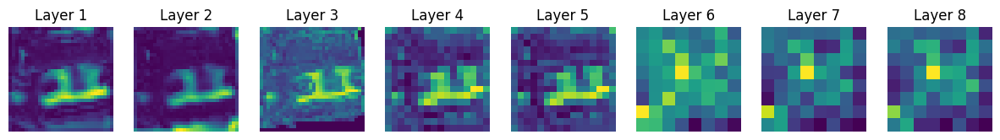

In [ ]:
visualize_feature_maps(model_e, sample_image[10], device)

# **Q2**

## download dataset

In [ ]:
!pip install kaggle

!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d sudhanshu2198/face-recognition-dataset-siamese-network

Dataset URL: https://www.kaggle.com/datasets/sudhanshu2198/face-recognition-dataset-siamese-network
License(s): apache-2.0


In [ ]:
# Assuming the downloaded dataset is named 'face-recognition-dataset-siamese-network.zip'
with zipfile.ZipFile('face-recognition-dataset-siamese-network.zip', 'r') as zip_ref:
    zip_ref.extractall('data/face_dataset')

### sample

In [ ]:
def show_random_faces(num_people=2, min_images=3, image_dir = 'face_dataset/dataset/train'):
    """Shows a random set of faces for each person."""

    people = random.sample(os.listdir(image_dir), num_people)

    for person in people:
        person_dir = os.path.join(image_dir, person)
        if os.path.isdir(person_dir):  # Ensure it's a directory
            image_files = [f for f in os.listdir(person_dir) if os.path.isfile(os.path.join(person_dir, f))]

          # if len(image_files) >= min_images:
            img_num = min(min_images, len(image_files))
            selected_images = random.sample(image_files, img_num)

            plt.figure(figsize=(10, 5))
            for i, image_file in enumerate(selected_images):
              image_path = os.path.join(person_dir, image_file)
              try:
                  img = Image.open(image_path)
                  plt.subplot(1, img_num, i + 1)
                  plt.imshow(img)
                  plt.title(f"Person: {person}")
                  plt.axis('off')
              except (IOError, OSError) as e:
                  print(f"Error opening image {image_path}: {e}")
        else:
            print(f"{person_dir} is not a directory.")

            plt.show()

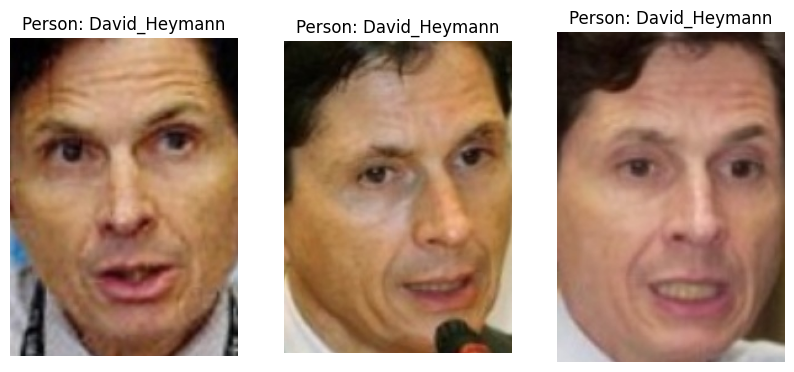

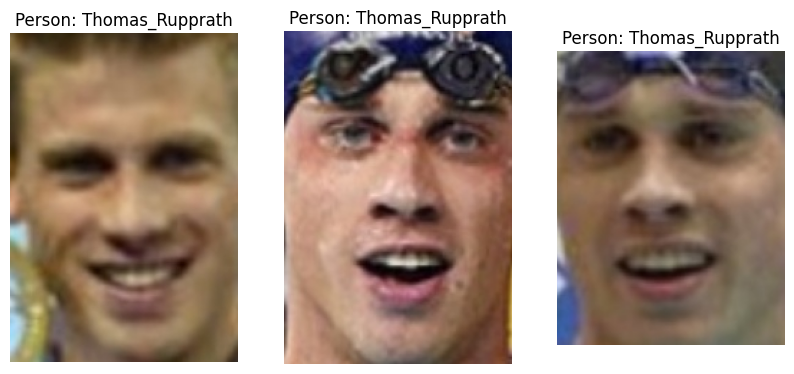

In [ ]:
show_random_faces(num_people=2, min_images=3)

## Data Preprocessing

In [ ]:
class FaceRecognitionDataset(Dataset):
    def __init__(self, root_dir, transform=None, split='train', val_split=0.001, seed=42):
        """
        Args:
            root_dir (str): Directory with subdirectories for each person's images.
            transform (callable, optional): Transformations to apply to the images.
            split (str): One of ['train', 'val', 'test'].
            val_split (float): Fraction of training data to use for validation.
            seed (int): Random seed for reproducibility.
        """
        self.root_dir = root_dir
        self.transform = transform if transform else transforms.ToTensor()
        self.split = split
        random.seed(seed)

        # Get list of people (subdirectories)
        self.people = os.listdir(root_dir)

        # Create a dictionary mapping person -> images
        self.data = {}
        for person in self.people:
            person_path = os.path.join(root_dir, person)
            if os.path.isdir(person_path):
                images = [os.path.join(person_path, img) for img in os.listdir(person_path)]
                if len(images) >= 2:  # Ensure at least two images per person
                    self.data[person] = images

        # Split validation data from training
        if split in ['train', 'val']:
            self._split_validation(val_split, seed)

        # Create list of pairs for sampling
        self.pairs = self._generate_pairs()

    def _split_validation(self, val_split, seed):
        """Splits training data into train and validation sets, ensuring each person has at least two images per split."""
        random.seed(seed)
        self.train_data = {}
        self.val_data = {}

        for person, images in self.data.items():
            random.shuffle(images)
            split_idx = max(2, int(len(images) * (1 - val_split)))  # Ensure at least two images per set
            self.train_data[person] = images[:split_idx]
            self.val_data[person] = images[split_idx:] if len(images[split_idx:]) >= 2 else images[:2]

        self.data = self.train_data if self.split == 'train' else self.val_data
        self.people = list(self.data.keys())

    def _generate_pairs(self):
        """Generate pairs of images dynamically based on a 50% chance rule."""
        pairs = []
        for person in self.people:
            images = self.data[person]
            num_images = len(images)

            for img1 in images:
                if random.random() < 0.5:  # 50% chance to pick same person
                    img2 = random.choice([img for img in images if img != img1])
                    label = 1
                else:  # 50% chance to pick different person
                    other_person = random.choice([p for p in self.people if p != person])
                    img2 = random.choice(self.data[other_person])
                    label = 0

                pairs.append((img1, img2, label))

        return pairs

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img1_path, img2_path, label = self.pairs[idx]

        img1 = Image.open(img1_path).convert('RGB')
        img2 = Image.open(img2_path).convert('RGB')

        if self.transform:
            img1 = self.transform(img1)
            img2 = self.transform(img2)

        return img1, img2, torch.tensor(label, dtype=torch.float32)


In [ ]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

# Create training and validation datasets
train_dataset = FaceRecognitionDataset(root_dir="/content/data/face_dataset/dataset/train", transform=transform, split='train')
val_dataset = FaceRecognitionDataset(root_dir="/content/data/face_dataset/dataset/train", transform=transform, split='val')
test_dataset = FaceRecognitionDataset(root_dir="/content/data/face_dataset/dataset/val", transform=transform, split='val')

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

print("Train dataset shape:", len(train_dataset))
print("Validation dataset shape:", len(val_dataset))
print("Test dataset shape:", len(test_dataset))

Train dataset shape: 5287
Validation dataset shape: 2868
Test dataset shape: 268


### sample pairs

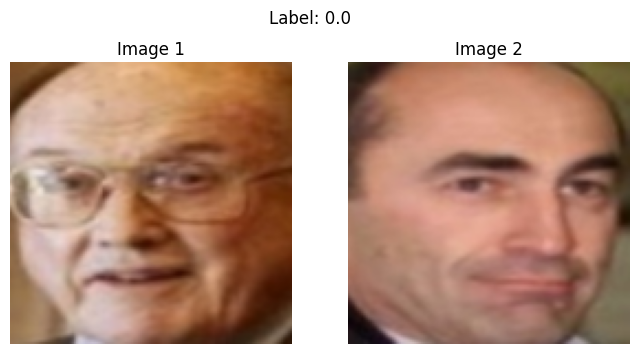

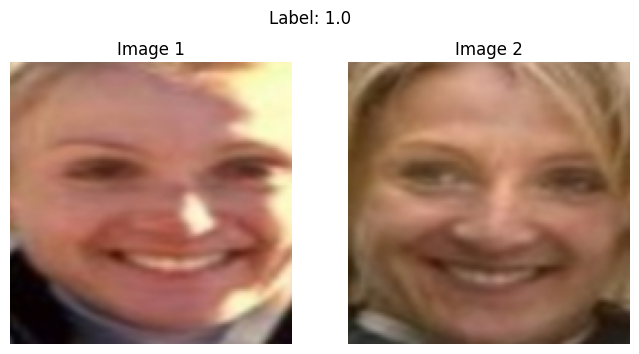

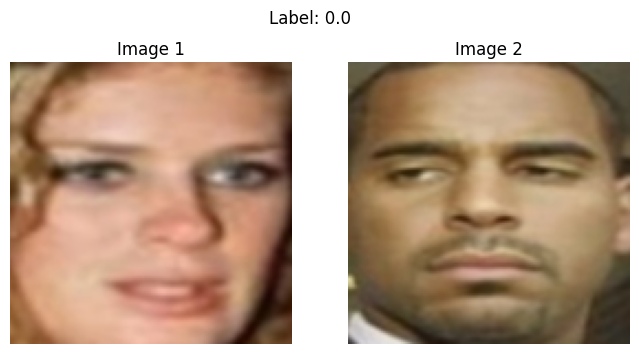

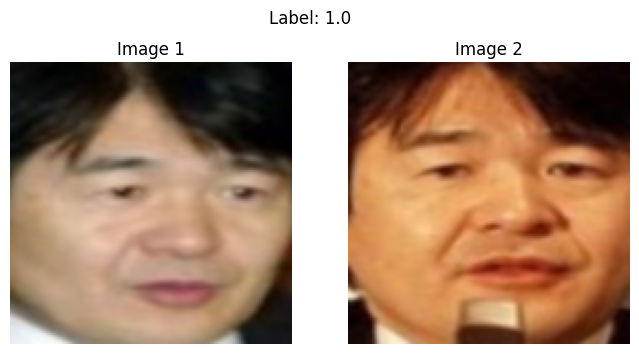

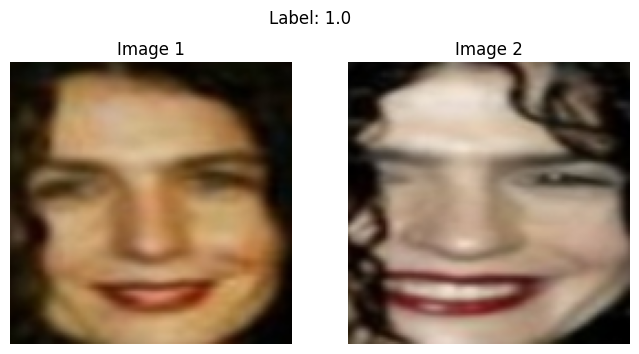

In [ ]:
def show_image_pairs(train_loader):
    """Prints some image pairs with their labels from the train dataset."""
    for img1, img2, label in train_loader:
        for i in range(min(5, len(img1))):  # Adjust number of pairs displayed
            plt.figure(figsize=(8, 4))

            plt.subplot(1, 2, 1)
            plt.imshow(img1[i].permute(1, 2, 0))  # Assuming images are in CxHxW format
            plt.title("Image 1")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(img2[i].permute(1, 2, 0))
            plt.title("Image 2")
            plt.axis('off')

            plt.suptitle(f"Label: {label[i].item()}")
            plt.show()
        break  # Stop after showing the first batch

show_image_pairs(train_loader)

## model

In [ ]:
class ContrastiveLoss(nn.Module):
    def __init__(self, margin=1.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, emb1, emb2, label):
        distance = torch.norm(emb1 - emb2, p=2, dim=1)
        loss = label * distance**2 + (1 - label) * torch.max(torch.tensor(0, dtype=torch.float32, device=emb1.device), torch.tensor(self.margin**2, dtype=torch.float32, device=emb1.device) - distance**2)
        return loss.mean()

In [ ]:
class SiameseNetwork(nn.Module):
    def __init__(self, embedding_dim=512):
        super(SiameseNetwork, self).__init__()

        # Load EfficientNetB0 as feature extractor
        self.efficientnet = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
        self.feature_extractor = nn.Sequential(*list(self.efficientnet.children())[:-1])  # Remove classification head

        # Fully connected layer to produce embeddings
        self.fc = nn.Sequential(
            nn.Linear(1280, embedding_dim),
            nn.ReLU()
        )

    def forward(self, img1, img2):
        emb1 = self.fc(self.feature_extractor(img1).view(img1.size(0), -1))
        emb2 = self.fc(self.feature_extractor(img2).view(img2.size(0), -1))

        return emb1, emb2

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
def plot_loss_curve(train_losses, val_losses, loss):
    plt.figure(figsize=(8,6))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel("Epochs")
    plt.ylabel(f"Loss ({loss})")
    plt.title("Loss Curve")
    plt.legend()
    plt.show()

In [ ]:
def train_siamese_model(train_loader, val_loader, device = torch.device("cuda" if torch.cuda.is_available() else "cpu"),
                        batch_size = 64, loss_margin=1, lr=0.001,
                        step_size=5, gamma=0.1, num_epochs = 20):

    model = SiameseNetwork().to(device)

    # Define the optimizer
    optimizer = optim.SGD(model.parameters(), lr=lr)

    # Define the learning rate scheduler (StepLR)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)

    criterion = ContrastiveLoss(margin=loss_margin)

    # Lists to store loss and accuracy
    train_losses = []
    val_losses = []

    start_time = time.time()

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for batch_idx, (img1, img2, label) in enumerate(train_loader): # Change: Unpack three values here
            img1, img2, label = img1.to(device), img2.to(device), label.to(device)  # Change: Move img1, img2, label to device

            optimizer.zero_grad()
            output1, output2 = model(img1, img2)
            loss = criterion(output1, output2, label)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            if batch_idx % 20 == 0:
                print(f"Epoch: {epoch+1}/{num_epochs}, Batch: {batch_idx}/{len(train_loader)}, Loss: {loss.item():.4f}")

        # Calculate epoch loss and accuracy
        avg_train_loss = running_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation loop
        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for img1, img2, label in val_loader:
                img1, img2, label = img1.to(device), img2.to(device), label.to(device)
                output1, output2 = model(img1, img2)
                loss = criterion(output1, output2, label)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)

        print(f"Epoch: {epoch+1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

        scheduler.step()

    end_time = time.time()
    training_time = end_time - start_time

    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"Number of trainable parameters: {trainable_params}")
    print(f"Training time: {training_time:.2f} seconds")

    plot_loss_curve(train_losses, val_losses, loss="Contrastive")
    return train_losses, val_losses, model

### train base

Epoch: 1/20, Batch: 0/83, Loss: 10.0766
Epoch: 1/20, Batch: 20/83, Loss: 8.5770
Epoch: 1/20, Batch: 40/83, Loss: 5.0238
Epoch: 1/20, Batch: 60/83, Loss: 4.0664
Epoch: 1/20, Batch: 80/83, Loss: 2.9420
Epoch: 1/20, Train Loss: 5.8063, Validation Loss: 3.2101
Epoch: 2/20, Batch: 0/83, Loss: 2.6999
Epoch: 2/20, Batch: 20/83, Loss: 2.2379
Epoch: 2/20, Batch: 40/83, Loss: 2.1222
Epoch: 2/20, Batch: 60/83, Loss: 1.1582
Epoch: 2/20, Batch: 80/83, Loss: 1.1719
Epoch: 2/20, Train Loss: 1.9719, Validation Loss: 1.3897
Epoch: 3/20, Batch: 0/83, Loss: 1.3218
Epoch: 3/20, Batch: 20/83, Loss: 0.9661
Epoch: 3/20, Batch: 40/83, Loss: 0.9254
Epoch: 3/20, Batch: 60/83, Loss: 0.7582
Epoch: 3/20, Batch: 80/83, Loss: 0.8121
Epoch: 3/20, Train Loss: 0.9380, Validation Loss: 0.7940
Epoch: 4/20, Batch: 0/83, Loss: 0.9236
Epoch: 4/20, Batch: 20/83, Loss: 0.8450
Epoch: 4/20, Batch: 40/83, Loss: 0.6518
Epoch: 4/20, Batch: 60/83, Loss: 0.7162
Epoch: 4/20, Batch: 80/83, Loss: 0.4895
Epoch: 4/20, Train Loss: 0.6320,

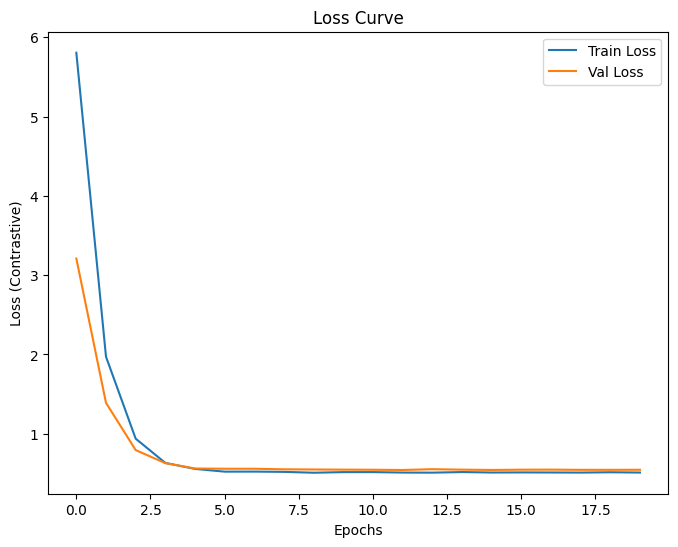

In [ ]:
train_losses, val_losses, model = train_siamese_model(train_loader, val_loader, device = device,
                                                      batch_size = 64, loss_margin=1, lr=0.001,
                                                      step_size=5, gamma=0.1, num_epochs = 20)

### distance

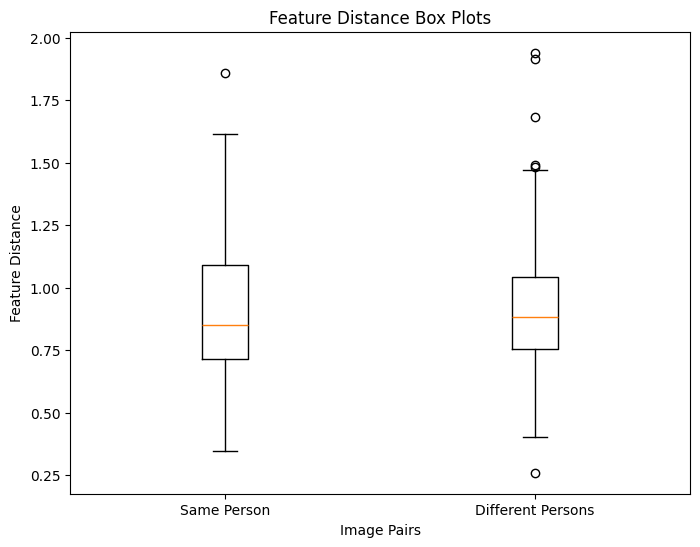

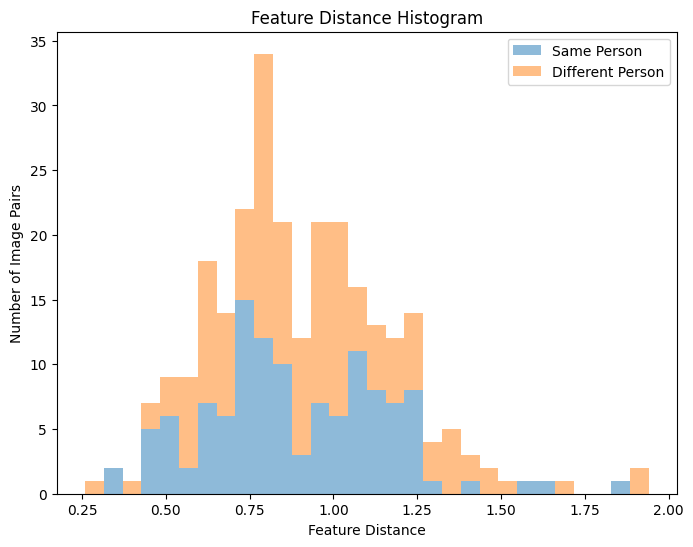

In [ ]:
analyze_feature_distances(model, test_loader, device)

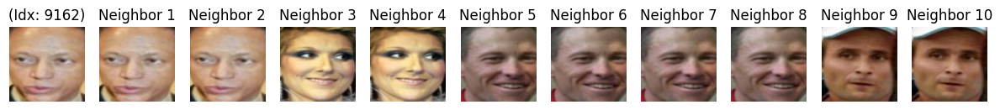

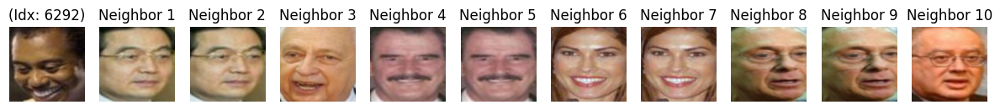

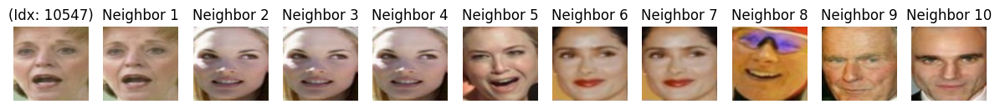

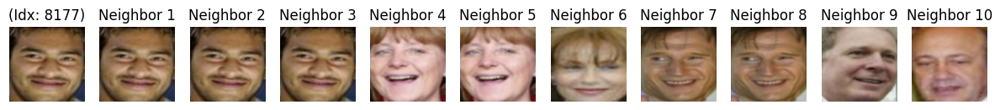

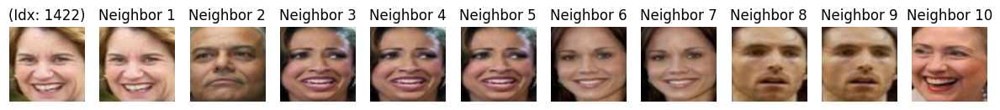

...

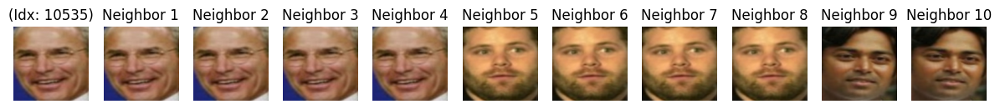

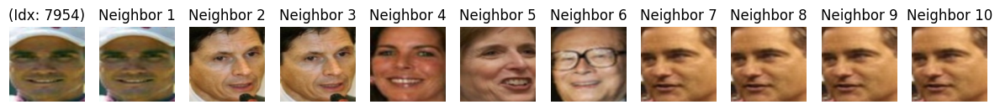

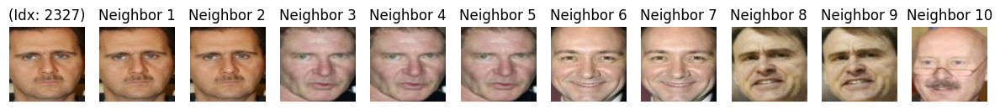

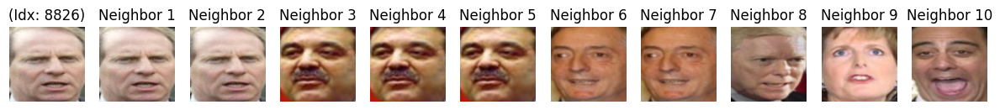

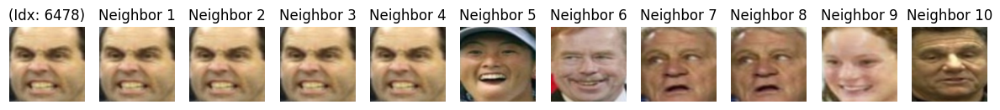

In [ ]:
plot_k_nearest_neighbors(model, train_loader, device, num_images=15)

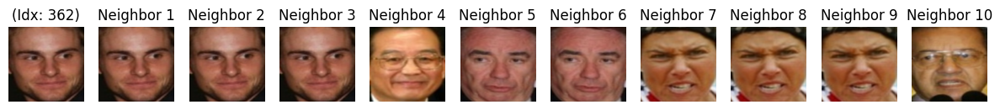

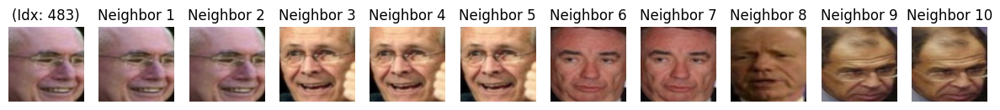

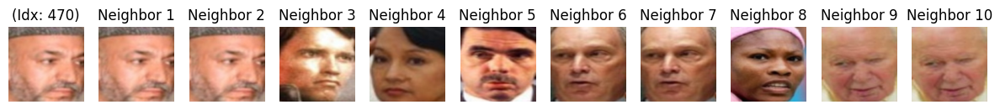

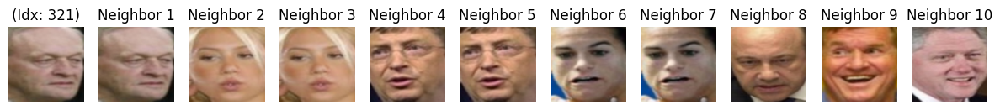

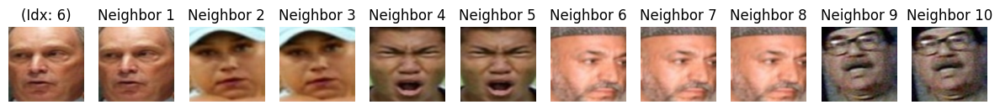

...

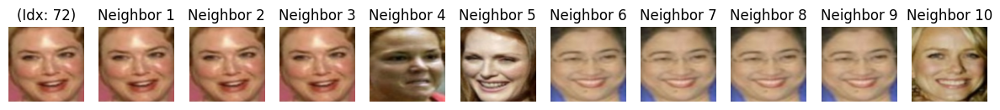

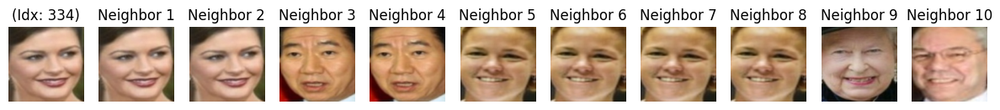

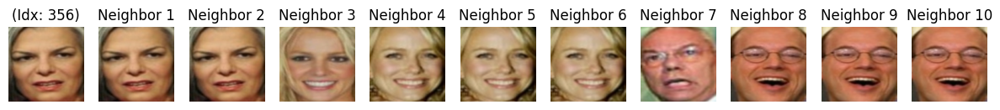

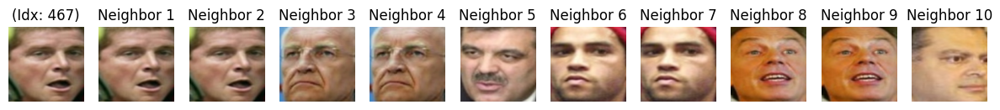

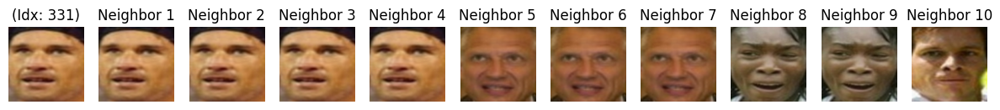

In [ ]:
plot_k_nearest_neighbors(model, test_loader, device, num_images=15)

## Hyperparameters tuning

In [ ]:
def random_search(param_distributions, num_iterations, train_loader, val_loader, device):
    """
    Performs random search to find the best hyperparameters.
    """
    best_loss = float('inf')
    best_params = {}
    best_model = None

    for _ in range(num_iterations):
        params = {k: random.choice(v) for k, v in param_distributions.items()}
        print(f"Trying parameters: {params}")

        train_losses, val_losses, model = train_siamese_model(train_loader, val_loader, device=device, **params) # Assuming train_model is defined

        current_loss = val_losses[-1] if val_losses else raiseExceptions("validation losses not found!")

        print(f"Validation Loss: {current_loss:.4f}")
        if current_loss < best_loss:
            best_loss = current_loss
            best_params = params
            best_model = model
            print(f"New best loss: {best_loss:.4f} with params: {best_params}")

    return best_params, best_loss, best_model

Trying parameters: {'lr': 0.001, 'loss_margin': 2, 'step_size': 10, 'gamma': 0.1, 'num_epochs': 20}


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 97.8MB/s]


Epoch: 1/20, Batch: 0/83, Loss: 12.1928
Epoch: 1/20, Batch: 20/83, Loss: 8.1905
Epoch: 1/20, Batch: 40/83, Loss: 5.5023
Epoch: 1/20, Batch: 60/83, Loss: 4.4581
Epoch: 1/20, Batch: 80/83, Loss: 3.3865
Epoch: 1/20, Train Loss: 5.9262, Validation Loss: 3.3046
Epoch: 2/20, Batch: 0/83, Loss: 3.4161
Epoch: 2/20, Batch: 20/83, Loss: 2.7617
Epoch: 2/20, Batch: 40/83, Loss: 2.0121
Epoch: 2/20, Batch: 60/83, Loss: 1.9362
Epoch: 2/20, Batch: 80/83, Loss: 2.1865
Epoch: 2/20, Train Loss: 2.3497, Validation Loss: 2.1400
Epoch: 3/20, Batch: 0/83, Loss: 1.8517
Epoch: 3/20, Batch: 20/83, Loss: 1.9503
Epoch: 3/20, Batch: 40/83, Loss: 2.1332
Epoch: 3/20, Batch: 60/83, Loss: 2.2186
Epoch: 3/20, Batch: 80/83, Loss: 1.7970
Epoch: 3/20, Train Loss: 2.0183, Validation Loss: 2.0148
Epoch: 4/20, Batch: 0/83, Loss: 1.7636
Epoch: 4/20, Batch: 20/83, Loss: 1.7963
Epoch: 4/20, Batch: 40/83, Loss: 1.7535
Epoch: 4/20, Batch: 60/83, Loss: 1.8963
Epoch: 4/20, Batch: 80/83, Loss: 1.8164
Epoch: 4/20, Train Loss: 1.9441,

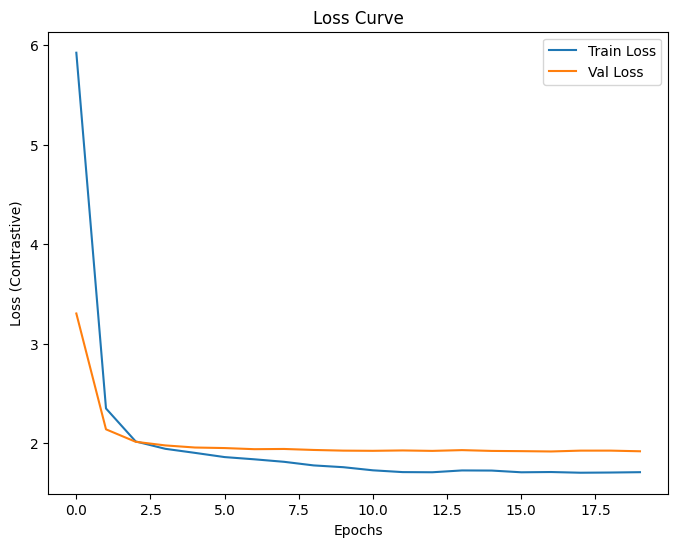

Validation Loss: 1.9194
New best loss: 1.9194 with params: {'lr': 0.001, 'loss_margin': 2, 'step_size': 10, 'gamma': 0.1, 'num_epochs': 20}
Trying parameters: {'lr': 0.1, 'loss_margin': 1.5, 'step_size': 10, 'gamma': 0.1, 'num_epochs': 15}
Epoch: 1/15, Batch: 0/83, Loss: 8.5875
Epoch: 1/15, Batch: 20/83, Loss: 1.1391
Epoch: 1/15, Batch: 40/83, Loss: 1.1370
Epoch: 1/15, Batch: 60/83, Loss: 1.0922
Epoch: 1/15, Batch: 80/83, Loss: 1.1861
Epoch: 1/15, Train Loss: 1.2228, Validation Loss: 1.0696
Epoch: 2/15, Batch: 0/83, Loss: 1.0482
Epoch: 2/15, Batch: 20/83, Loss: 1.1606
Epoch: 2/15, Batch: 40/83, Loss: 1.0922
Epoch: 2/15, Batch: 60/83, Loss: 1.0811
Epoch: 2/15, Batch: 80/83, Loss: 1.0723
Epoch: 2/15, Train Loss: 1.0849, Validation Loss: 1.0655
Epoch: 3/15, Batch: 0/83, Loss: 1.0778
Epoch: 3/15, Batch: 20/83, Loss: 1.1611
Epoch: 3/15, Batch: 40/83, Loss: 1.2739
Epoch: 3/15, Batch: 60/83, Loss: 0.8615
Epoch: 3/15, Batch: 80/83, Loss: 1.0783
Epoch: 3/15, Train Loss: 1.0679, Validation Loss:

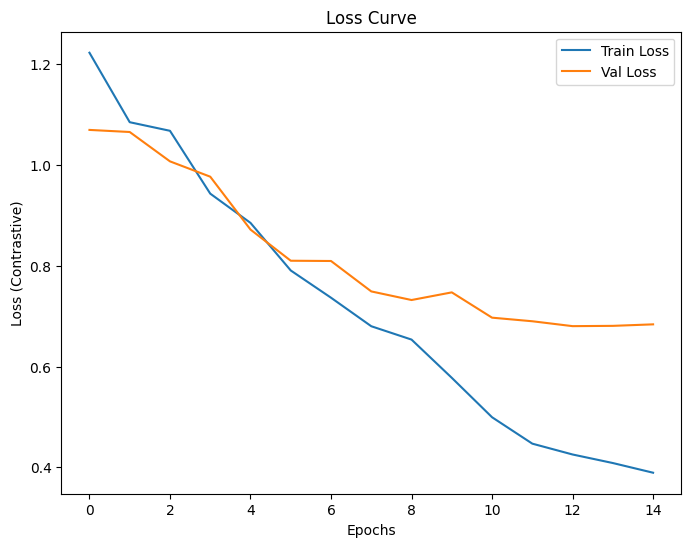

Validation Loss: 0.6838
New best loss: 0.6838 with params: {'lr': 0.1, 'loss_margin': 1.5, 'step_size': 10, 'gamma': 0.1, 'num_epochs': 15}
Trying parameters: {'lr': 0.01, 'loss_margin': 2, 'step_size': 5, 'gamma': 0.05, 'num_epochs': 20}
Epoch: 1/20, Batch: 0/83, Loss: 11.4846
Epoch: 1/20, Batch: 20/83, Loss: 2.1923
Epoch: 1/20, Batch: 40/83, Loss: 2.0102
Epoch: 1/20, Batch: 60/83, Loss: 1.8972
Epoch: 1/20, Batch: 80/83, Loss: 1.9092
Epoch: 1/20, Train Loss: 2.4508, Validation Loss: 1.9606
Epoch: 2/20, Batch: 0/83, Loss: 1.8890
Epoch: 2/20, Batch: 20/83, Loss: 1.7681
Epoch: 2/20, Batch: 40/83, Loss: 1.7026
Epoch: 2/20, Batch: 60/83, Loss: 2.0419
Epoch: 2/20, Batch: 80/83, Loss: 1.8329
Epoch: 2/20, Train Loss: 1.8041, Validation Loss: 1.9045
Epoch: 3/20, Batch: 0/83, Loss: 1.5601
Epoch: 3/20, Batch: 20/83, Loss: 1.5188
Epoch: 3/20, Batch: 40/83, Loss: 1.4170
Epoch: 3/20, Batch: 60/83, Loss: 1.7574
Epoch: 3/20, Batch: 80/83, Loss: 1.7631
Epoch: 3/20, Train Loss: 1.6274, Validation Loss:

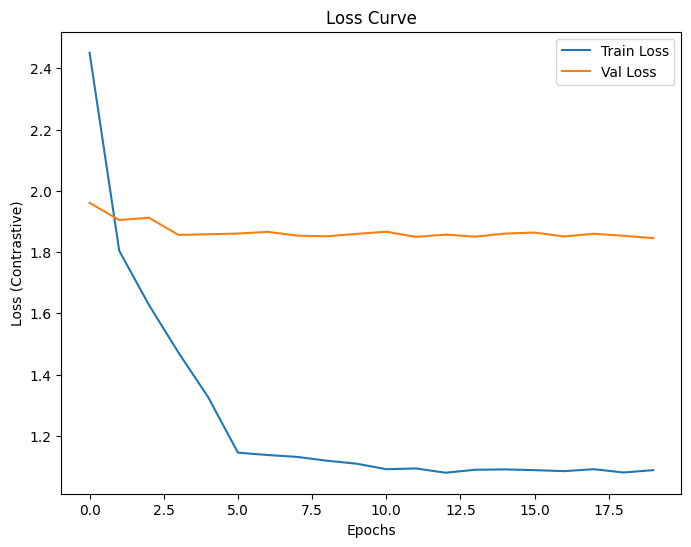

Validation Loss: 1.8455
Trying parameters: {'lr': 0.01, 'loss_margin': 1.5, 'step_size': 10, 'gamma': 0.05, 'num_epochs': 15}
Epoch: 1/15, Batch: 0/83, Loss: 9.7185
Epoch: 1/15, Batch: 20/83, Loss: 1.3544
Epoch: 1/15, Batch: 40/83, Loss: 1.1894
Epoch: 1/15, Batch: 60/83, Loss: 1.1584
Epoch: 1/15, Batch: 80/83, Loss: 1.1720
Epoch: 1/15, Train Loss: 1.7573, Validation Loss: 1.1048
Epoch: 2/15, Batch: 0/83, Loss: 1.1099
Epoch: 2/15, Batch: 20/83, Loss: 1.0604
Epoch: 2/15, Batch: 40/83, Loss: 1.0515
Epoch: 2/15, Batch: 60/83, Loss: 0.8934
Epoch: 2/15, Batch: 80/83, Loss: 1.0785
Epoch: 2/15, Train Loss: 1.0445, Validation Loss: 1.0816
Epoch: 3/15, Batch: 0/83, Loss: 1.0013
Epoch: 3/15, Batch: 20/83, Loss: 0.9050
Epoch: 3/15, Batch: 40/83, Loss: 0.8873
Epoch: 3/15, Batch: 60/83, Loss: 0.9439
Epoch: 3/15, Batch: 80/83, Loss: 0.9273
Epoch: 3/15, Train Loss: 0.9747, Validation Loss: 1.0793
Epoch: 4/15, Batch: 0/83, Loss: 0.8922
Epoch: 4/15, Batch: 20/83, Loss: 0.9150
Epoch: 4/15, Batch: 40/83, 

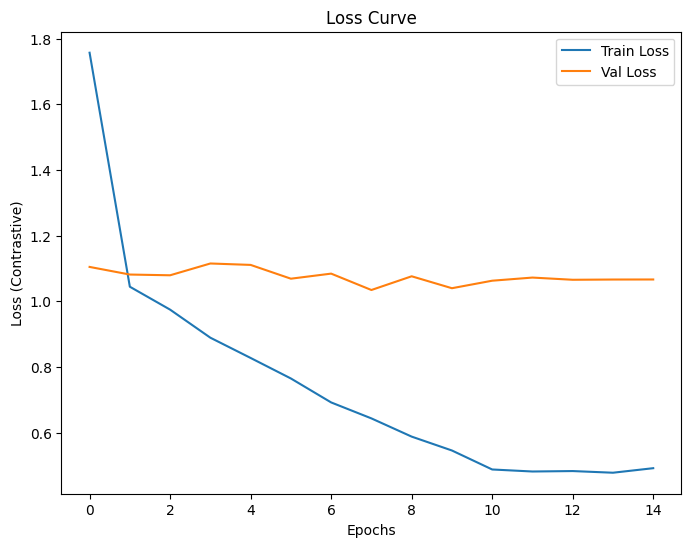

Validation Loss: 1.0665
Trying parameters: {'lr': 0.001, 'loss_margin': 1.0, 'step_size': 10, 'gamma': 0.1, 'num_epochs': 20}
Epoch: 1/20, Batch: 0/83, Loss: 9.1503
Epoch: 1/20, Batch: 20/83, Loss: 7.0144
Epoch: 1/20, Batch: 40/83, Loss: 4.3121
Epoch: 1/20, Batch: 60/83, Loss: 3.4045
Epoch: 1/20, Batch: 80/83, Loss: 3.2617
Epoch: 1/20, Train Loss: 5.6039, Validation Loss: 3.1637
Epoch: 2/20, Batch: 0/83, Loss: 3.4400
Epoch: 2/20, Batch: 20/83, Loss: 2.5841
Epoch: 2/20, Batch: 40/83, Loss: 1.8449
Epoch: 2/20, Batch: 60/83, Loss: 1.5793
Epoch: 2/20, Batch: 80/83, Loss: 1.4269
Epoch: 2/20, Train Loss: 1.9176, Validation Loss: 1.3416
Epoch: 3/20, Batch: 0/83, Loss: 1.1369
Epoch: 3/20, Batch: 20/83, Loss: 0.9570
Epoch: 3/20, Batch: 40/83, Loss: 1.0628
Epoch: 3/20, Batch: 60/83, Loss: 0.6784
Epoch: 3/20, Batch: 80/83, Loss: 0.7396
Epoch: 3/20, Train Loss: 0.9241, Validation Loss: 0.7533
Epoch: 4/20, Batch: 0/83, Loss: 0.7333
Epoch: 4/20, Batch: 20/83, Loss: 0.5292
Epoch: 4/20, Batch: 40/83, 

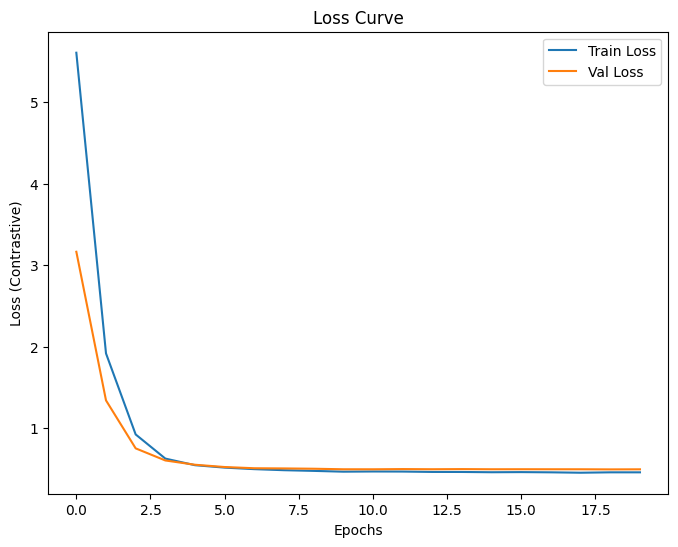

Validation Loss: 0.4965
New best loss: 0.4965 with params: {'lr': 0.001, 'loss_margin': 1.0, 'step_size': 10, 'gamma': 0.1, 'num_epochs': 20}

Best hyperparameters found: {'lr': 0.001, 'loss_margin': 1.0, 'step_size': 10, 'gamma': 0.1, 'num_epochs': 20}
Best validation loss: 0.4965


In [ ]:
param_distributions = {
    'lr': [0.001, 0.01, 0.1],
    'loss_margin': [0.5, 1.0, 1.5, 2],
    'step_size': [5, 10],
    'gamma': [0.1, 0.05],
    'num_epochs': [15, 20]
    # Add other hyperparameters to the search space
}

best_params, best_loss, best_model = random_search(param_distributions, num_iterations=5,
                                                   train_loader=train_loader, val_loader=val_loader,
                                                   device=device)

print(f"\nBest hyperparameters found: {best_params}")
print(f"Best validation loss: {best_loss:.4f}")

In [ ]:
torch.save(best_model.state_dict(), 'best_model_weights.pth')

In [ ]:
def load_weights_from_file(model, file_path):
  """Loads model weights from a specified file.

  Args:
    model: The PyTorch model to load weights into.
    file_path: The path to the weights file.

  Returns:
    The model with loaded weights, or None if loading fails.
  """
  try:
    model.load_state_dict(torch.load(file_path))
    print(f"Weights loaded successfully from {file_path}")
    return model
  except FileNotFoundError:
    print(f"Error: Weights file not found at {file_path}")
    return None
  except RuntimeError as e:
    print(f"Error loading weights: {e}")
    return None

## Model Behavior Analysis

In [ ]:
def analyze_feature_distances(model, dataloader, device):
    """
    Calculates and plots the feature distances for same and different person image pairs.
    """
    model.eval()
    distances_same = []
    distances_diff = []

    with torch.no_grad():
        for img1, img2, label in dataloader:
            img1, img2, label = img1.to(device), img2.to(device), label.to(device)
            emb1, emb2 = model(img1, img2)
            distances = torch.norm(emb1 - emb2, p=2, dim=1).cpu().numpy()

            for i in range(len(label)):
                if label[i].item() == 1:
                    distances_same.append(distances[i])
                else:
                    distances_diff.append(distances[i])

    # Create box plots
    plt.figure(figsize=(8, 6))
    plt.boxplot([distances_same, distances_diff], tick_labels=['Same Person', 'Different Persons'])
    plt.xlabel('Image Pairs')
    plt.ylabel('Feature Distance')
    plt.title('Feature Distance Box Plots')
    plt.show()

    # Stacked Histogram
    plt.figure(figsize=(8, 6))
    plt.hist([distances_same, distances_diff], bins=30, stacked=True, label=['Same Person', 'Different Person'], alpha=0.5)
    plt.xlabel('Feature Distance')
    plt.ylabel('Number of Image Pairs')
    plt.title('Feature Distance Histogram')
    plt.legend()
    plt.show()

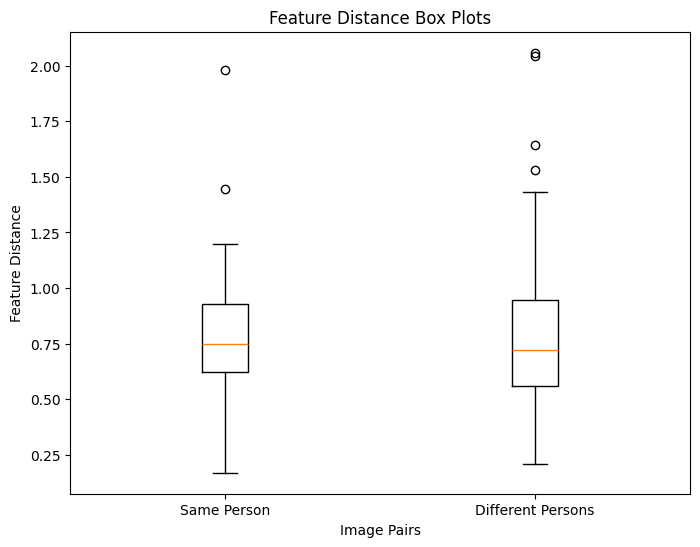

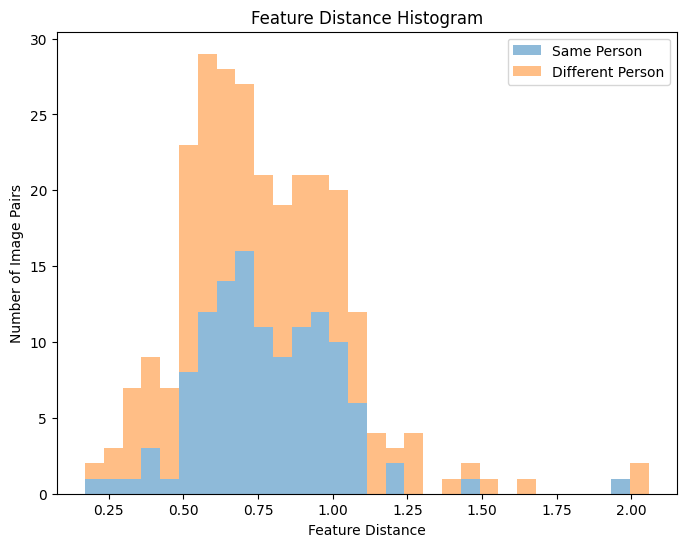

In [ ]:
analyze_feature_distances(best_model, test_loader, device)

In [ ]:
def plot_k_nearest_neighbors(model, dataloader, device, num_images = 5, k=10):
    """
    Plots k-nearest neighbors for 5 random images from the dataset.
    """
    model.eval()
    image_features = []
    image_labels = []
    all_images = []

    with torch.no_grad():
        for img1, img2, label in dataloader:
            img1, img2 = img1.to(device), img2.to(device)
            emb1, emb2 = model(img1, img2)
            image_features.extend(emb1.cpu().numpy())
            image_features.extend(emb2.cpu().numpy())
            all_images.extend(img1.cpu()) # Move images to CPU here
            all_images.extend(img2.cpu()) # Move images to CPU here
            image_labels.extend(label)
            image_labels.extend(label)


    image_features = np.array(image_features)

    # Select random images
    random_indices = np.random.choice(len(image_features), num_images, replace=False)

    for index in random_indices:
        # Calculate cosine similarity
        similarities = cosine_similarity([image_features[index]], image_features)

        # Get indices of k-nearest neighbors (excluding the image itself)
        nearest_neighbors_indices = np.argsort(similarities[0])[::-1][1:k+1]

        # Plot the original image and its nearest neighbors
        plt.figure(figsize=(15, 4))

        # Original image
        plt.subplot(1, k + 1, 1)
        plt.imshow(all_images[index].permute(1, 2, 0).numpy()) # Convert to numpy array
        plt.title(f"(Idx: {index})")
        plt.axis('off')

        # Nearest neighbors
        for i, neighbor_index in enumerate(nearest_neighbors_indices):
            plt.subplot(1, k + 1, i + 2)
            plt.imshow(all_images[neighbor_index].permute(1, 2, 0).numpy()) # Convert to numpy array
            plt.title(f"Neighbor {i + 1}")
            plt.axis('off')

        plt.show()

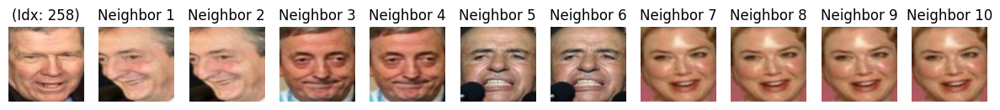

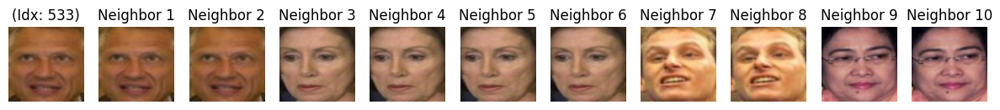

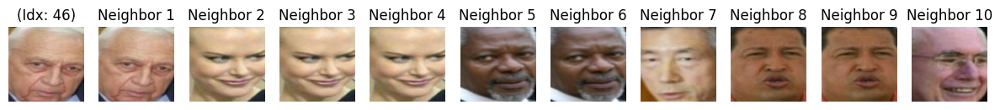

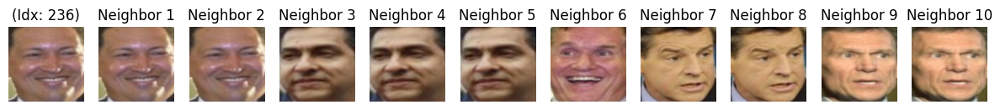

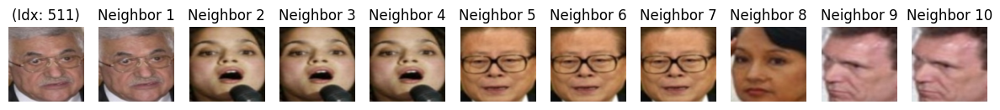

In [ ]:
plot_k_nearest_neighbors(best_model, test_loader, device)

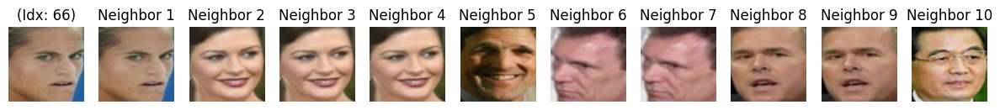

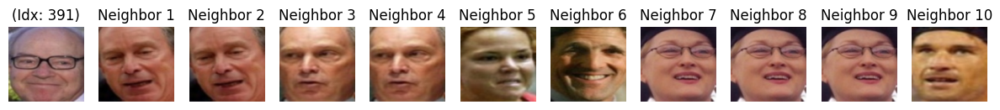

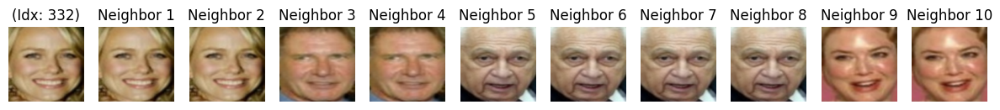

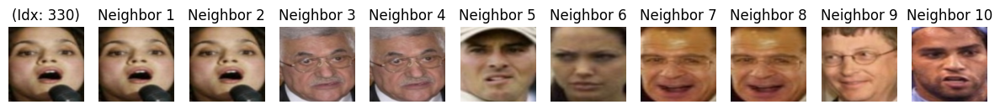

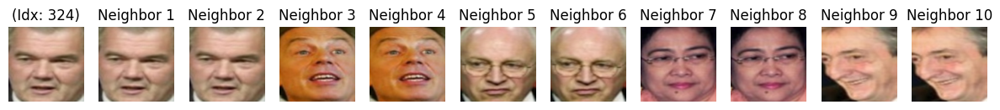

...

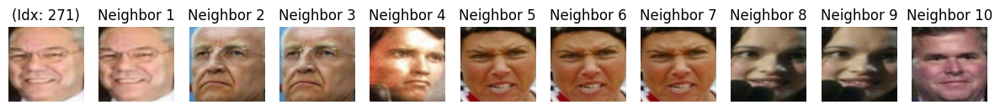

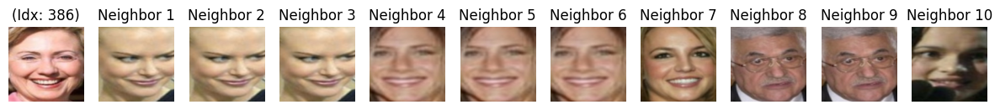

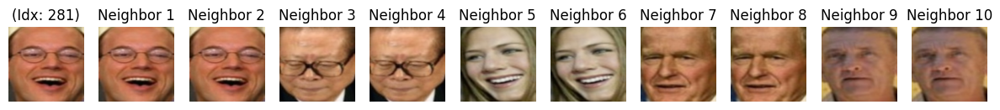

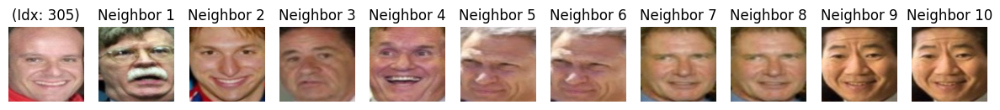

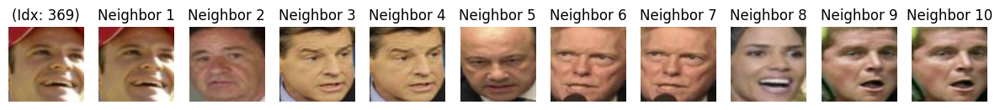

In [ ]:
plot_k_nearest_neighbors(best_model, test_loader, device, num_images=15)

## *Bonuses*

###  if margin = 2, ...

Epoch: 1/20, Batch: 0/83, Loss: 9.8782
Epoch: 1/20, Batch: 20/83, Loss: 5.0755
Epoch: 1/20, Batch: 40/83, Loss: 5.3927
Epoch: 1/20, Batch: 60/83, Loss: 3.2638
Epoch: 1/20, Batch: 80/83, Loss: 2.7039
Epoch: 1/20, Train Loss: 5.8230, Validation Loss: 3.2598
Epoch: 2/20, Batch: 0/83, Loss: 3.2321
Epoch: 2/20, Batch: 20/83, Loss: 2.3903
Epoch: 2/20, Batch: 40/83, Loss: 2.3315
Epoch: 2/20, Batch: 60/83, Loss: 2.5185
Epoch: 2/20, Batch: 80/83, Loss: 2.4432
Epoch: 2/20, Train Loss: 2.3016, Validation Loss: 2.1318
Epoch: 3/20, Batch: 0/83, Loss: 2.2017
Epoch: 3/20, Batch: 20/83, Loss: 1.8349
Epoch: 3/20, Batch: 40/83, Loss: 1.9378
Epoch: 3/20, Batch: 60/83, Loss: 2.2312
Epoch: 3/20, Batch: 80/83, Loss: 2.0182
Epoch: 3/20, Train Loss: 1.9961, Validation Loss: 2.0228
Epoch: 4/20, Batch: 0/83, Loss: 2.0414
Epoch: 4/20, Batch: 20/83, Loss: 1.6807
Epoch: 4/20, Batch: 40/83, Loss: 2.0421
Epoch: 4/20, Batch: 60/83, Loss: 1.9368
Epoch: 4/20, Batch: 80/83, Loss: 2.0155
Epoch: 4/20, Train Loss: 1.9255, 

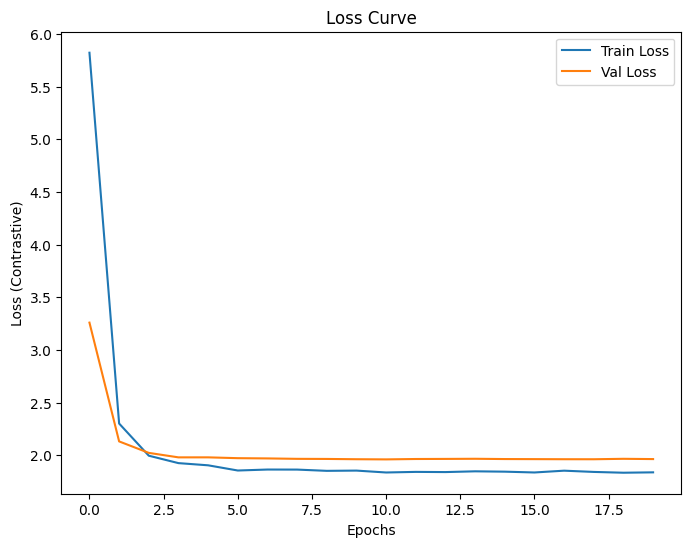

In [ ]:
train_losses2, val_losses2, model2 = train_siamese_model(train_loader, val_loader, device = device,
                                                         batch_size = 64, loss_margin=2, lr=0.001,
                                                         step_size=5, gamma=0.1, num_epochs = 20)

### Triplet Loss Tryout

In [ ]:
class TripletLoss(nn.Module):
    def __init__(self, margin=1.0):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, anchor, positive, negative):
        pos_dist = torch.norm(anchor - positive, p=2, dim=1)  # ||f(A) - f(P)||
        neg_dist = torch.norm(anchor - negative, p=2, dim=1)  # ||f(A) - f(N)||
        loss = torch.mean(torch.relu(pos_dist - neg_dist + self.margin))
        return loss